In [64]:
import matplotlib.pyplot as plt
from matplotlib import patches
import random
import math

In [65]:
with open('../../../data/event000000000-spacepoint.csv', 'r', encoding='utf8') as file:
    lines = file.readlines()

for line in lines[:5]:
    print(line, end='')

measurement_id,geometry_id,x,y,z,var_r,var_z
0,1152921779484760320,156.76506,-5.30625391,-1523.19995,0.000899999985,8.43614858e-37
1,1152921779484760576,153.652435,25.7113953,-1524.40002,0.000899999985,8.43614858e-37
2,1152921779484760576,154.974457,28.9229641,-1524.40002,0.000899999985,8.43614858e-37
3,1152921779484760832,-15.4573355,157.548386,-1523.19995,0.000899999985,8.43614858e-37


In [66]:
points = []
for line in lines[1:]:
    point_variables = line.strip().split(',')
    point = {
        'x': float(point_variables[2]),
        'y': float(point_variables[3]),
        'z': float(point_variables[4]),
    }
    points.append(point)

print(points[0])

{'x': 156.76506, 'y': -5.30625391, 'z': -1523.19995}


In [67]:
min_x = min([point['x'] for point in points])
max_x = max([point['x'] for point in points])
min_y = min([point['y'] for point in points])
max_y = max([point['y'] for point in points])
min_z = min([point['z'] for point in points])
max_z = max([point['z'] for point in points])

print("min_x: ", min_x)
print("max_x: ", max_x)
print("min_y: ", min_y)
print("max_y: ", max_y)
print("min_z: ", min_z)
print("max_z: ", max_z)

min_x:  -1030.81348
max_x:  1029.92615
min_y:  -1028.98901
max_y:  1030.02991
min_z:  -3025.5
max_z:  3025.5


In [68]:
class DetectorProperties:
    max_abs_xy = 1100
    max_abs_z = 3100

In [69]:
def get_3d_plot_figure(figure_size, keep_aspect_ratio=False):
    figure = plt.figure(figsize=figure_size)
    ax = plt.axes(projection='3d')
    ax.set_xlim([-DetectorProperties.max_abs_z, DetectorProperties.max_abs_z] if keep_aspect_ratio else [-DetectorProperties.max_abs_xy, DetectorProperties.max_abs_xy])
    ax.set_ylim([-DetectorProperties.max_abs_z, DetectorProperties.max_abs_z])
    ax.set_zlim([-DetectorProperties.max_abs_z, DetectorProperties.max_abs_z] if keep_aspect_ratio else [-DetectorProperties.max_abs_xy, DetectorProperties.max_abs_xy])
    ax.set_xlabel('x')
    ax.set_ylabel('z')
    ax.set_zlabel('y')
    ax.set_facecolor('black')
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.tick_params(colors='white')
    ax.xaxis.label.set_color('white')
    ax.yaxis.label.set_color('white')
    ax.zaxis.label.set_color('white')
    return figure, ax

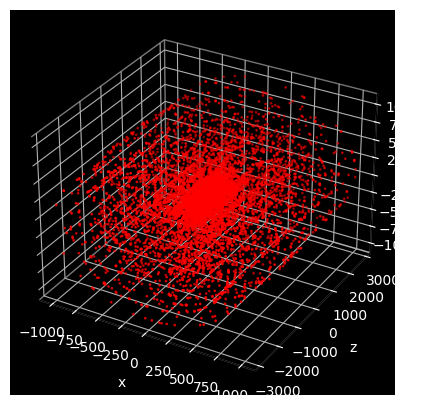

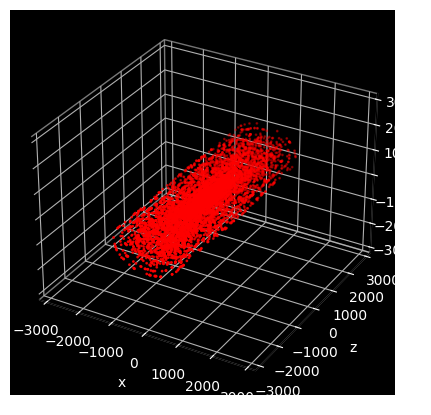

In [70]:
def plot_points(points, sample_size=None, figure=None, ax=None, keep_aspect_ratio=False, figure_size=(10, 10), point_size=4, color='red'):
    if figure is None or ax is None:
        figure, ax = get_3d_plot_figure(figure_size=figure_size, keep_aspect_ratio=keep_aspect_ratio)

    points_to_plot = random.sample(points, sample_size) if sample_size is not None else points
    points_x = [point['x'] for point in points_to_plot]
    points_y = [point['y'] for point in points_to_plot]
    points_z = [point['z'] for point in points_to_plot]
    ax.scatter3D(points_x, points_z, points_y, color=color, s=point_size)

plot_points(points, 10000, figure_size=(5, 5), point_size=1)
plot_points(points, 10000, figure_size=(5, 5), keep_aspect_ratio=True, point_size=1)

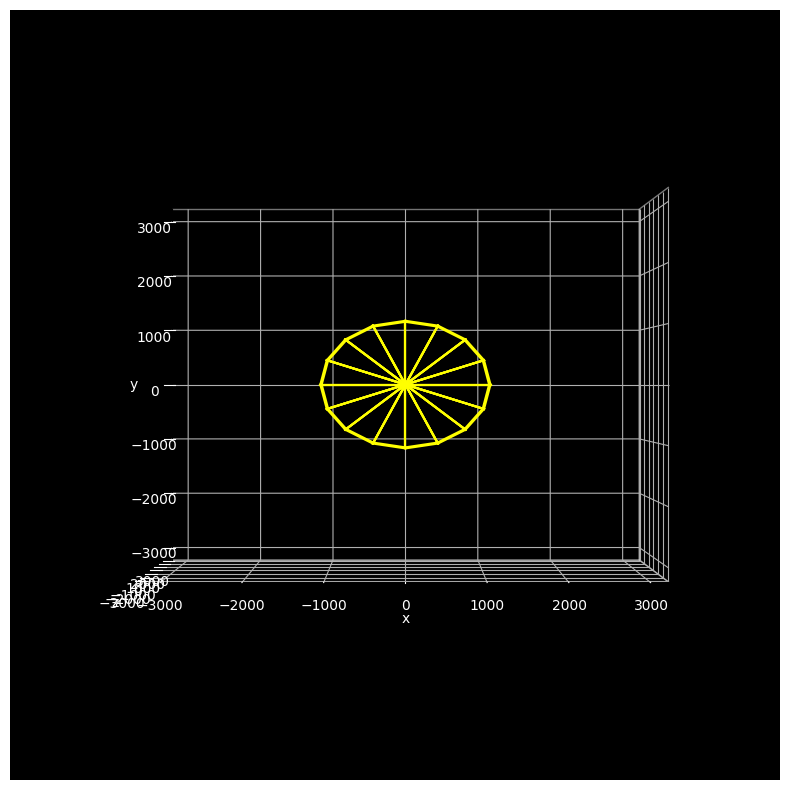

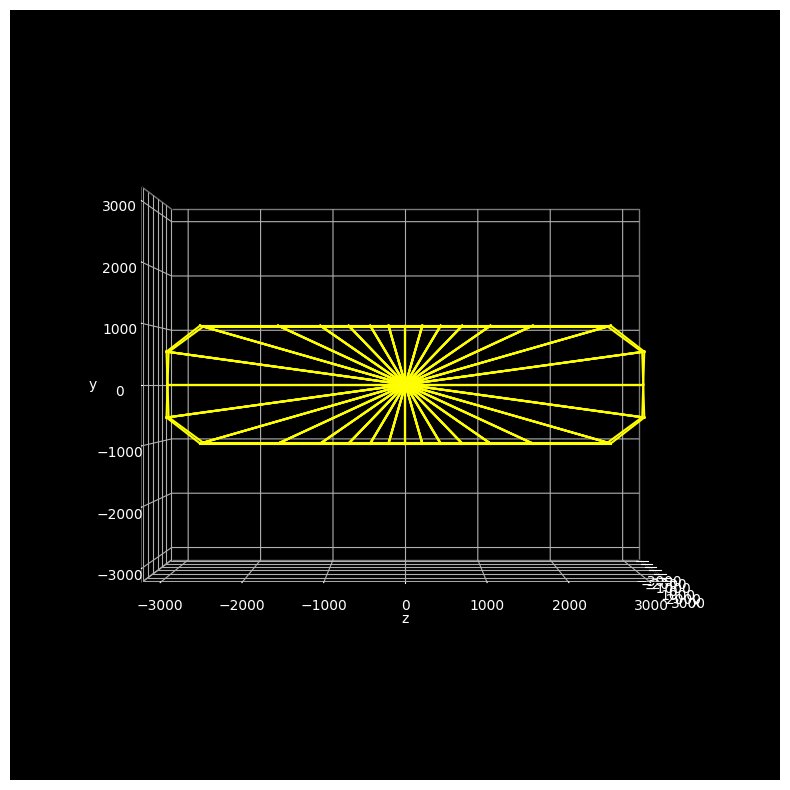

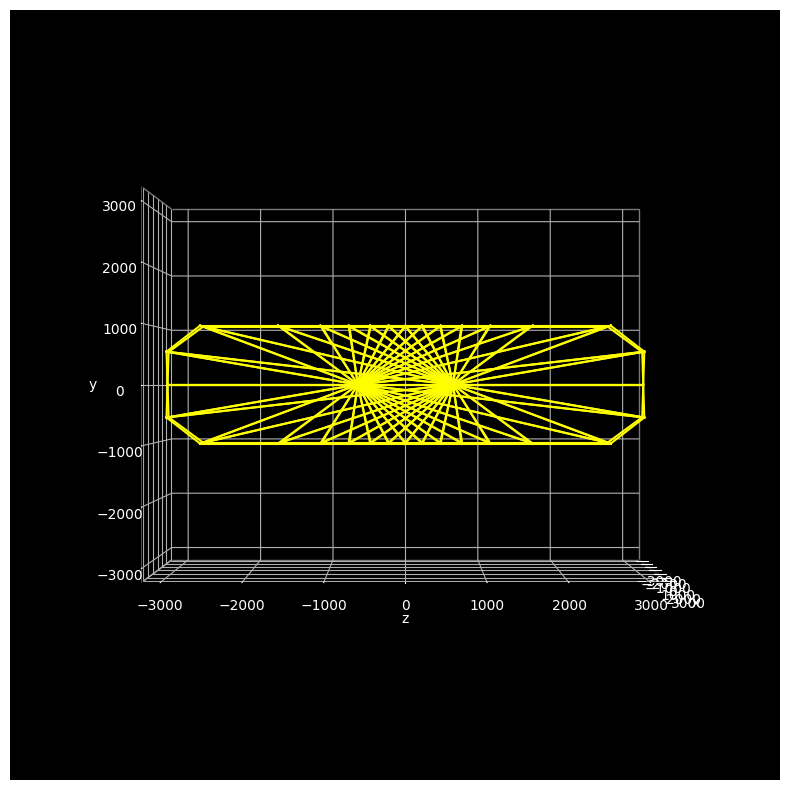

In [71]:
class Wedge:
    def __init__(self, z_angle_min, z_angle_max, x_angle_min, x_angle_max, interaction_region_width):
        self.z_angle_min = z_angle_min
        self.z_angle_max = z_angle_max
        self.x_angle_min = x_angle_min
        self.x_angle_max = x_angle_max
        self.interaction_region_width = interaction_region_width

    def get_outermost_points(self):
        def angles_to_xyz(z_angle, x_angle):
            x_plane_direction_z = math.cos(x_angle)
            x_plane_direction_y = math.sin(x_angle)

            x_plane_scale_to_z_limit = abs(x_plane_direction_z) / DetectorProperties.max_abs_z
            x_plane_scale_to_y_limit = abs(x_plane_direction_y) / DetectorProperties.max_abs_xy
            scale = 1 / max(x_plane_scale_to_z_limit, x_plane_scale_to_y_limit)
            
            return {
                'x': x_plane_direction_y * math.cos(z_angle) * scale,
                'y': x_plane_direction_y * math.sin(z_angle) * scale,
                'z': x_plane_direction_z * scale
            }

        return {
            'z_angle_min_x_angle_min': angles_to_xyz(self.z_angle_min, self.x_angle_min),
            'z_angle_min_x_angle_max': angles_to_xyz(self.z_angle_min, self.x_angle_max),
            'z_angle_max_x_angle_min': angles_to_xyz(self.z_angle_max, self.x_angle_min),
            'z_angle_max_x_angle_max': angles_to_xyz(self.z_angle_max, self.x_angle_max)
        }
    
    def get_interaction_region_zs(self):
        return {
            'x_angle_min': (1 if self.x_angle_min <= math.pi else -1) * self.interaction_region_width / 2,
            'x_angle_max': (-1 if self.x_angle_max <= math.pi else 1) * self.interaction_region_width / 2,
        }

def plot_wedge_lines(figure, ax, wedge, color='yellow'):
    outermost_points = wedge.get_outermost_points()
    interaction_region_zs = wedge.get_interaction_region_zs()

    xs = []
    xs.append([0, outermost_points['z_angle_min_x_angle_min']['x']])
    xs.append([0, outermost_points['z_angle_min_x_angle_max']['x']])
    xs.append([0, outermost_points['z_angle_max_x_angle_min']['x']])
    xs.append([0, outermost_points['z_angle_max_x_angle_max']['x']])
    xs.append([outermost_points['z_angle_min_x_angle_min']['x'], outermost_points['z_angle_min_x_angle_max']['x']])
    xs.append([outermost_points['z_angle_max_x_angle_min']['x'], outermost_points['z_angle_max_x_angle_max']['x']])
    xs.append([outermost_points['z_angle_min_x_angle_min']['x'], outermost_points['z_angle_max_x_angle_min']['x']])
    xs.append([outermost_points['z_angle_min_x_angle_max']['x'], outermost_points['z_angle_max_x_angle_max']['x']])

    ys = []
    ys.append([0, outermost_points['z_angle_min_x_angle_min']['y']])
    ys.append([0, outermost_points['z_angle_min_x_angle_max']['y']])
    ys.append([0, outermost_points['z_angle_max_x_angle_min']['y']])
    ys.append([0, outermost_points['z_angle_max_x_angle_max']['y']])
    ys.append([outermost_points['z_angle_min_x_angle_min']['y'], outermost_points['z_angle_min_x_angle_max']['y']])
    ys.append([outermost_points['z_angle_max_x_angle_min']['y'], outermost_points['z_angle_max_x_angle_max']['y']])
    ys.append([outermost_points['z_angle_min_x_angle_min']['y'], outermost_points['z_angle_max_x_angle_min']['y']])
    ys.append([outermost_points['z_angle_min_x_angle_max']['y'], outermost_points['z_angle_max_x_angle_max']['y']])

    zs = []
    zs.append([interaction_region_zs['x_angle_min'], outermost_points['z_angle_min_x_angle_min']['z']])
    zs.append([interaction_region_zs['x_angle_max'], outermost_points['z_angle_min_x_angle_max']['z']])
    zs.append([interaction_region_zs['x_angle_min'], outermost_points['z_angle_max_x_angle_min']['z']])
    zs.append([interaction_region_zs['x_angle_max'], outermost_points['z_angle_max_x_angle_max']['z']])
    zs.append([outermost_points['z_angle_min_x_angle_min']['z'], outermost_points['z_angle_min_x_angle_max']['z']])
    zs.append([outermost_points['z_angle_max_x_angle_min']['z'], outermost_points['z_angle_max_x_angle_max']['z']])
    zs.append([outermost_points['z_angle_min_x_angle_min']['z'], outermost_points['z_angle_max_x_angle_min']['z']])
    zs.append([outermost_points['z_angle_min_x_angle_max']['z'], outermost_points['z_angle_max_x_angle_max']['z']])

    for i in range(len(xs)):
        ax.plot(xs[i], zs[i], ys[i], color=color)


wedges = [Wedge(i * 1 / 8 * math.pi, (i + 1) * 1 / 8 * math.pi, 3 * 1 / 8 * math.pi, 5 * 1 / 8 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z) for i in range(16)]
figure, ax = get_3d_plot_figure(figure_size=(10, 10), keep_aspect_ratio=True)
ax.view_init(elev=0, azim=270, roll=0)
for wedge in wedges:
    plot_wedge_lines(figure, ax, wedge)

wedges = [Wedge(3 * 1 / 8 * math.pi, 5 * 1 / 8 * math.pi, i * 1 / 16 * math.pi, (i + 1) * 1 / 16 * math.pi, 0) for i in range(32)]
figure, ax = get_3d_plot_figure(figure_size=(10, 10), keep_aspect_ratio=True)
ax.view_init(elev=0, azim=0, roll=0)
for wedge in wedges:
    plot_wedge_lines(figure, ax, wedge)

wedges = [Wedge(3 * 1 / 8 * math.pi, 5 * 1 / 8 * math.pi, i * 1 / 16 * math.pi, (i + 1) * 1 / 16 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z) for i in range(32)]
figure, ax = get_3d_plot_figure(figure_size=(10, 10), keep_aspect_ratio=True)
ax.view_init(elev=0, azim=0, roll=0)
for wedge in wedges:
    plot_wedge_lines(figure, ax, wedge)


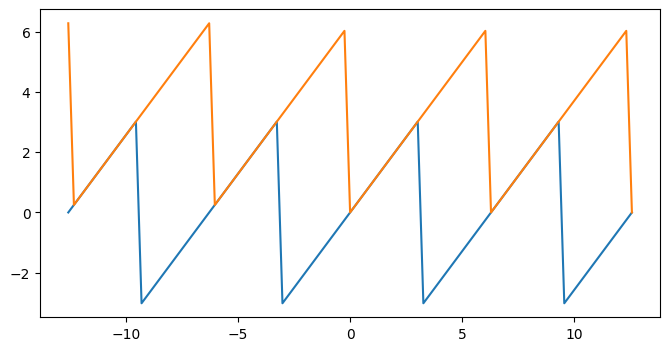

In [72]:
def angle_wrap(angle):
    return math.fmod(angle + math.pi, 2 * math.pi) + (-1 + 2 * (1 if angle + math.pi < 0 else 0)) * math.pi

def angle_wrap_2pi(angle):
    return math.fmod(angle, 2 * math.pi) if angle >= 0 else (2 * math.pi + math.fmod(angle, 2 * math.pi))

# point[0] == min_value, point[-1] == max_value
def uniform_range(min_value, max_value, num_points):
    return [min_value + i * (max_value - min_value) / (num_points - 1) for i in range(num_points)]

figure_size = (8, 4)
figure = plt.figure(figsize=figure_size)
ax = figure.gca()
test_range = uniform_range(-4 * math.pi, 4 * math.pi, 101)
ax.plot(test_range, [angle_wrap(i) for i in test_range])
ax.plot(test_range, [angle_wrap_2pi(i) for i in test_range])

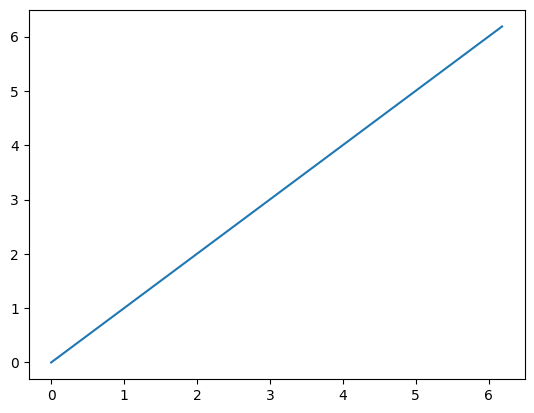

In [73]:
def atan2_2pi(y, x):
    return angle_wrap_2pi(math.atan2(y, x))

phi = [i / 64 * 2 * math.pi for i in range(64)]
x = [math.cos(angle) for angle in phi]
y = [math.sin(angle) for angle in phi]
phi_recalculated = [atan2_2pi(y, x) for x, y in zip(x, y)]
plt.plot(phi, phi_recalculated)

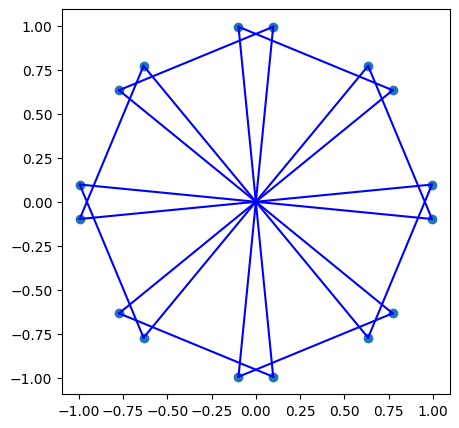

In [74]:
def uniform_range_split(num_ranges, min_range, max_range, margin):
    boundaries = uniform_range(min_range, max_range, num_ranges + 1)
    return [(boundaries[i] - margin, boundaries[i + 1] + margin) for i in range(num_ranges)]

figure_size = (5, 5)
figure = plt.figure(figsize=figure_size)
ax = figure.gca()

ranges = uniform_range_split(8, 0, 2 * math.pi, 2 * math.pi / 64)

outermost_points = []
for (range_min, range_max) in ranges:
    range_min_x = math.cos(range_min) 
    range_min_y = math.sin(range_min)
    range_max_x = math.cos(range_max)
    range_max_y = math.sin(range_max)
    outermost_points.append((range_min_x, range_min_y))
    outermost_points.append((range_max_x, range_max_y))
    plt.plot([0, range_min_x], [0, range_min_y], c='blue')
    plt.plot([0, range_max_x], [0, range_max_y], c='blue')
    plt.plot([range_min_x, range_max_x], [range_min_y, range_max_y], c='blue')
plt.scatter([i[0] for i in outermost_points], [i[1] for i in outermost_points])

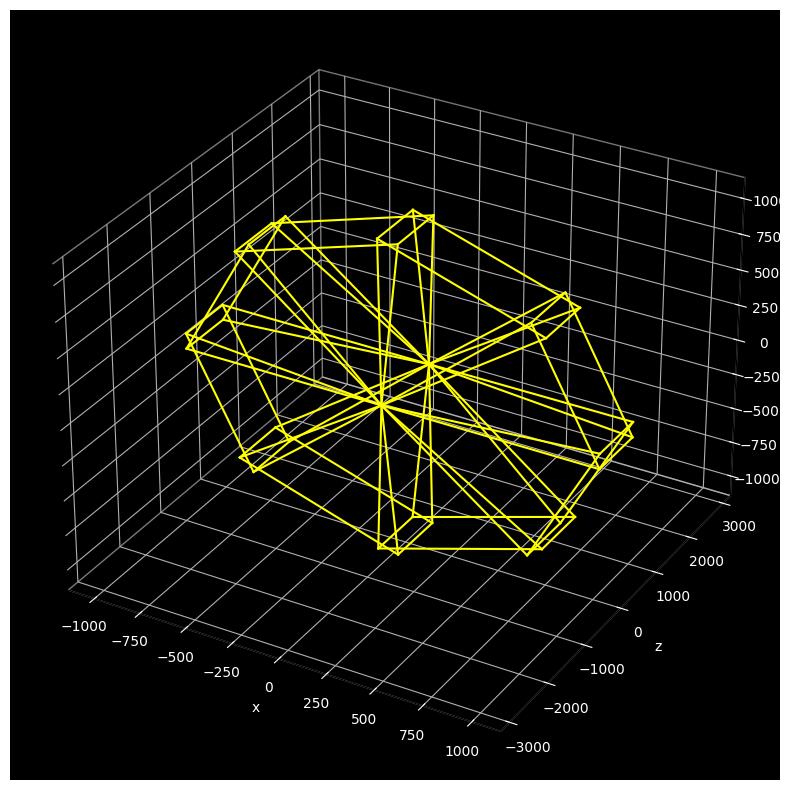

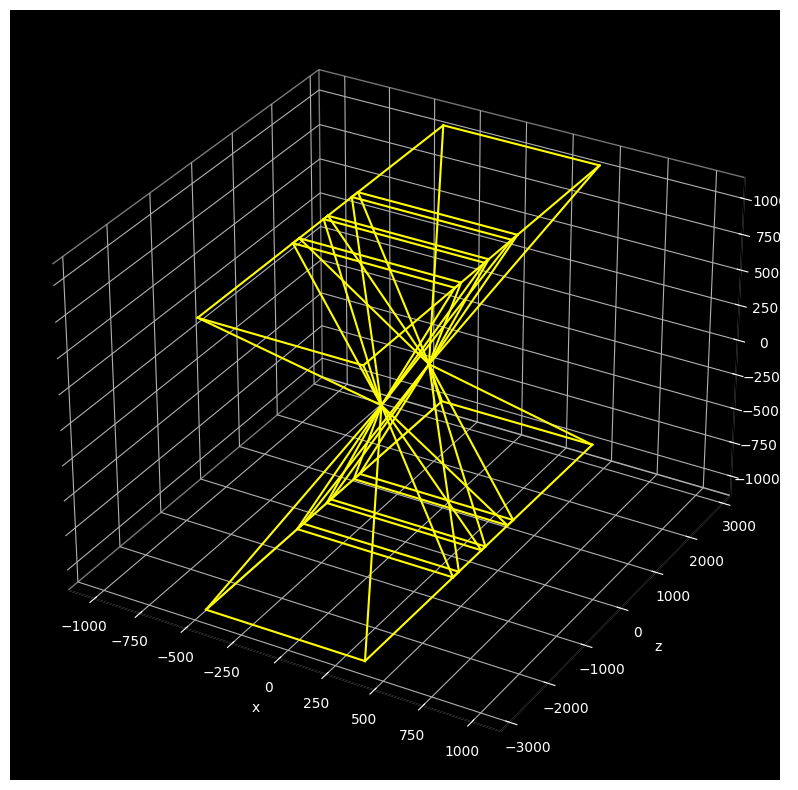

In [75]:
z_ranges = [(angle_wrap_2pi(i[0]), angle_wrap_2pi(i[1])) for i in uniform_range_split(8, 0, 2 * math.pi, 2 * math.pi / 128)]
wedges = [Wedge(z_range[0], z_range[1], 3 * 1 / 8 * math.pi, 5 * 1 / 8 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z) for z_range in z_ranges]

figure, ax = get_3d_plot_figure(figure_size=(10, 10))
for wedge in wedges:
    plot_wedge_lines(figure, ax, wedge)

x_ranges = uniform_range_split(4, 8 / 64 * math.pi, 56 / 64 * math.pi, 2 * math.pi / 128)
x_ranges.extend(uniform_range_split(4, 72 / 64 * math.pi, 120 / 64 * math.pi, 2 * math.pi / 128))

wedges = [Wedge(3 * 1 / 8 * math.pi, 5 * 1 / 8 * math.pi, x_range[0], x_range[1], 2 * 0.2 * DetectorProperties.max_abs_z) for x_range in x_ranges]

figure, ax = get_3d_plot_figure(figure_size=(10, 10))
for wedge in wedges:
    plot_wedge_lines(figure, ax, wedge)

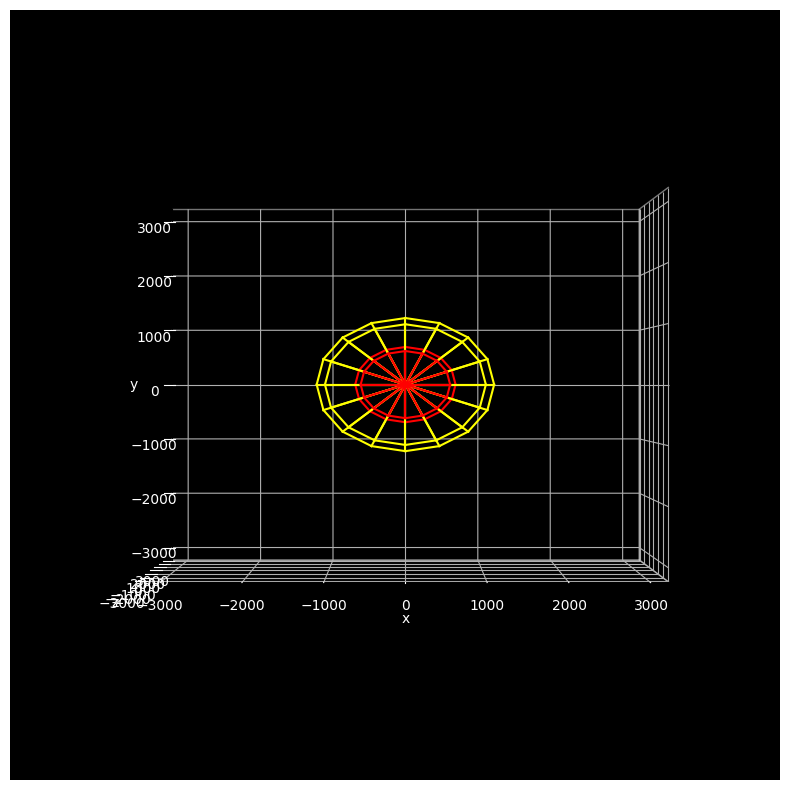

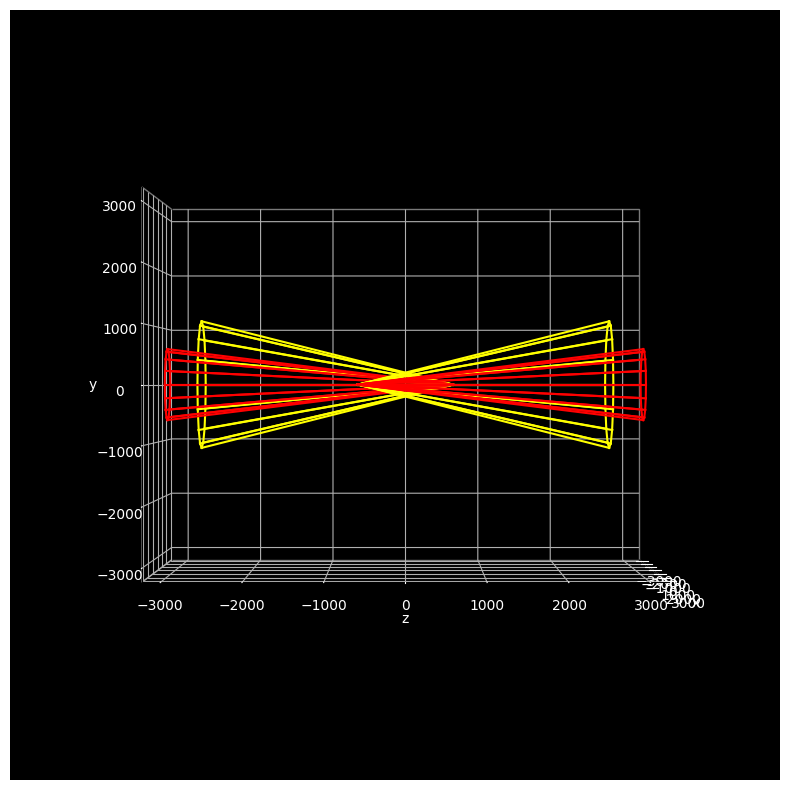

In [76]:
class PoleRegion:
    def __init__(self, x_angle, interaction_region_width):
        self.x_angle = x_angle
        self.interaction_region_width = interaction_region_width

    def get_outermost_points(self, num_points):
        x_plane_direction_z = math.cos(self.x_angle)
        x_plane_direction_y = math.sin(self.x_angle)

        x_plane_scale_to_z_limit = abs(x_plane_direction_z) / DetectorProperties.max_abs_z
        x_plane_scale_to_y_limit = abs(x_plane_direction_y) / DetectorProperties.max_abs_xy
        scale = 1 / max(x_plane_scale_to_z_limit, x_plane_scale_to_y_limit)

        points = []
        for z_angle in [i / num_points * 2 * math.pi for i in range(num_points)]:
            points.append({
                'x': x_plane_direction_y * math.cos(z_angle) * scale,
                'y': x_plane_direction_y * math.sin(z_angle) * scale,
                'z': x_plane_direction_z * scale
            })
        return points
    
    def get_interaction_region_z(self):
        return (1 if self.x_angle > math.pi / 2 else -1) * self.interaction_region_width / 2

def plot_pole_region(figure, ax, region, num_rays=16, color='yellow'):
    outermost_points = region.get_outermost_points(num_rays)
    interaction_region_z = region.get_interaction_region_z()

    xs = []
    ys = []
    zs = []
    for point in outermost_points:
        xs.append([0, point['x']])
        ys.append([0, point['y']])
        zs.append([interaction_region_z, point['z']])

    for i in range(len(outermost_points) - 1):
        xs.append([outermost_points[i]['x'], outermost_points[i + 1]['x']])
        ys.append([outermost_points[i]['y'], outermost_points[i + 1]['y']])
        zs.append([outermost_points[i]['z'], outermost_points[i + 1]['z']])

    xs.append([outermost_points[-1]['x'], outermost_points[0]['x']])
    ys.append([outermost_points[-1]['y'], outermost_points[0]['y']])
    zs.append([outermost_points[-1]['z'], outermost_points[0]['z']])

    for i in range(len(xs)):
        ax.plot(xs[i], zs[i], ys[i], color=color)

pole_region = PoleRegion(56 / 64 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z)
pole_region2 = PoleRegion(60 / 64 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z)
pole_region3 = PoleRegion(8 / 64 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z)
pole_region4 = PoleRegion(4 / 64 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z)

figure, ax = get_3d_plot_figure(figure_size=(10, 10), keep_aspect_ratio=True)
ax.view_init(elev=0, azim=270, roll=0)
num_rays = 16
plot_pole_region(figure, ax, pole_region, num_rays=num_rays)
plot_pole_region(figure, ax, pole_region2, num_rays=num_rays, color="red")
plot_pole_region(figure, ax, pole_region3, num_rays=num_rays)
plot_pole_region(figure, ax, pole_region4, num_rays=num_rays, color="red")

figure, ax = get_3d_plot_figure(figure_size=(10, 10), keep_aspect_ratio=True)
ax.view_init(elev=0, azim=0, roll=0)
num_rays = 16
plot_pole_region(figure, ax, pole_region, num_rays=num_rays)
plot_pole_region(figure, ax, pole_region2, num_rays=num_rays, color="red")
plot_pole_region(figure, ax, pole_region3, num_rays=num_rays)
plot_pole_region(figure, ax, pole_region4, num_rays=num_rays, color="red")


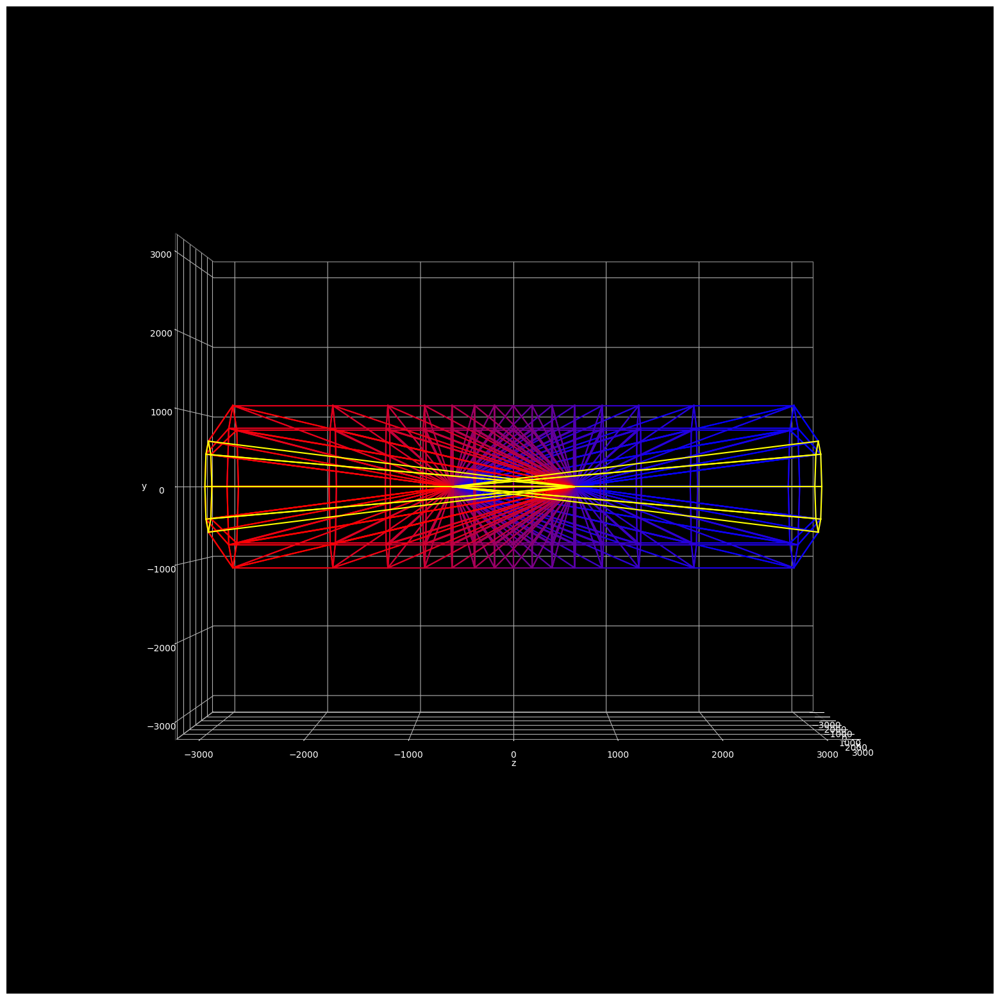

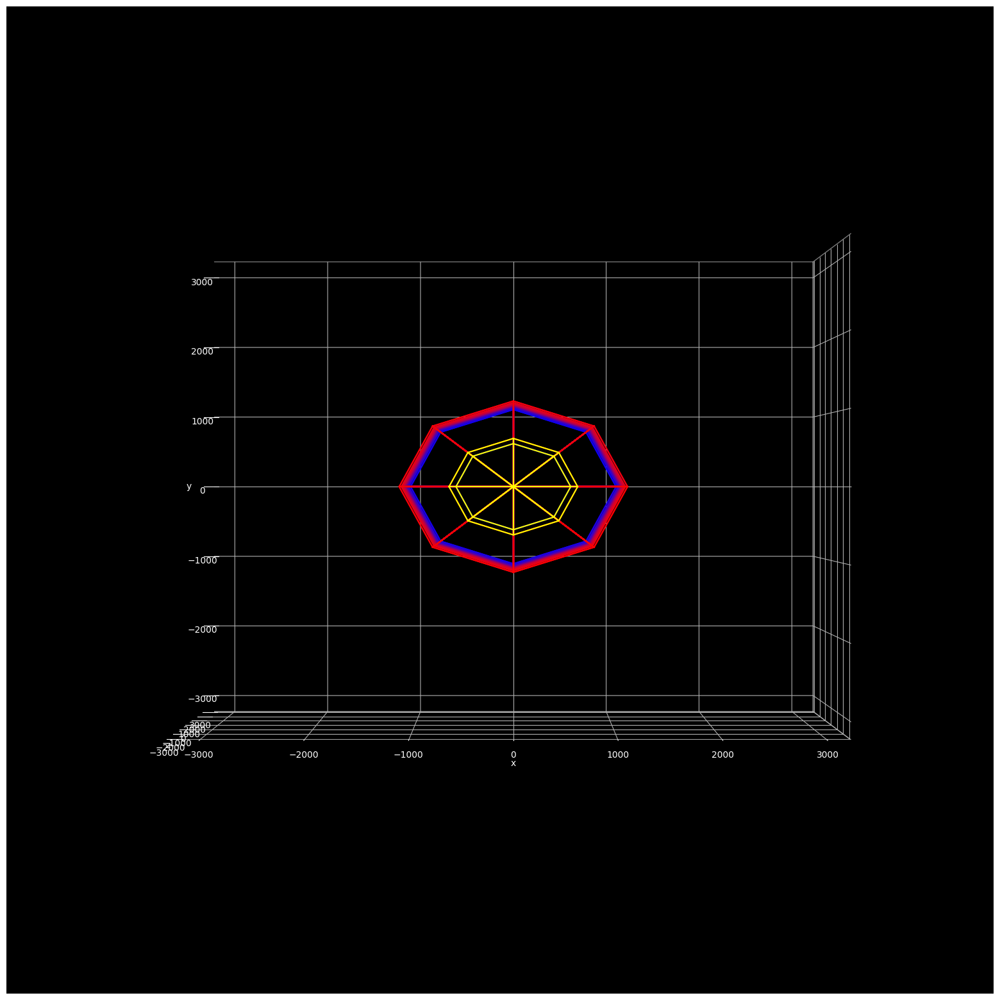

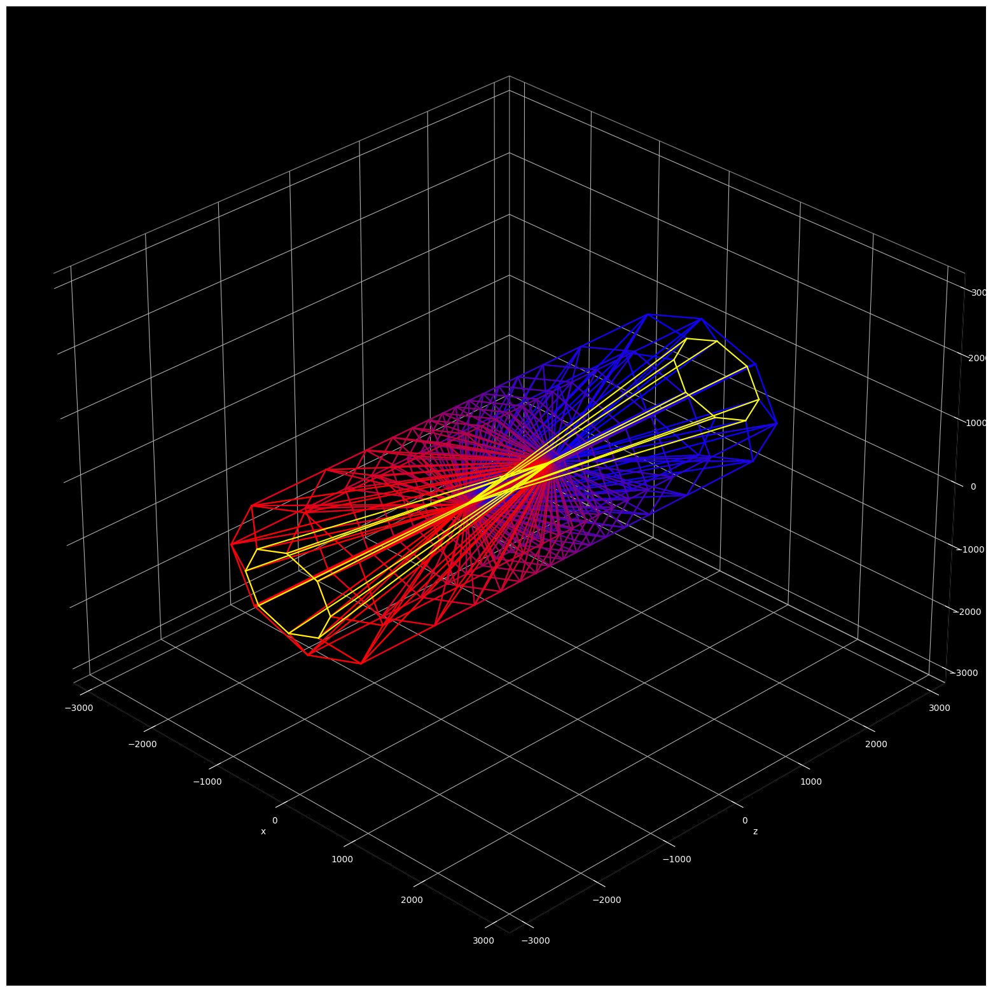

In [77]:
def get_wedges(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin=0):
    z_ranges = [(angle_wrap_2pi(i[0]), angle_wrap_2pi(i[1])) for i in uniform_range_split(num_z_ranges, 0, 2 * math.pi, margin)]
    x_ranges = uniform_range_split(num_x_ranges, min_x_angle, math.pi - min_x_angle, margin)

    wedges = []
    for x_range in x_ranges:
        for z_range in z_ranges:
            wedges.append(Wedge(z_range[0], z_range[1], x_range[0], x_range[1], interaction_region_width))
    return wedges

def get_pole_regions(min_x_angle, interaction_region_width, margin=0):
    return [
        PoleRegion(min_x_angle + margin, interaction_region_width),
        PoleRegion(math.pi - min_x_angle - margin, interaction_region_width)
    ]

def get_wedges_and_pole_regions(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin=0):
    return get_wedges(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin), get_pole_regions(min_x_angle, interaction_region_width, margin)

num_z_ranges = 8
num_x_ranges = 16
min_x_angle = 4 / 64 * math.pi
interaction_region_width = 2 * 0.2 * DetectorProperties.max_abs_z
wedges, pole_regions = get_wedges_and_pole_regions(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width)

perspectives = []
perspectives.append({'elev': 0, 'azim': 0, 'roll': 0})
perspectives.append({'elev': 0, 'azim': 270, 'roll': 0})
perspectives.append({'elev': 30, 'azim': -45, 'roll': 0})
for perspective in perspectives:
    figure, ax = get_3d_plot_figure(figure_size=(20, 20), keep_aspect_ratio=True)
    ax.view_init(elev=perspective['elev'], azim=perspective['azim'], roll=perspective['roll'])
    for i in range(len(wedges)):
        red = (i / (len(wedges) - 1))
        blue = 1 - red
        plot_wedge_lines(figure, ax, wedges[i], color=(red, 0, blue))
    for pole_region in pole_regions:
        plot_pole_region(figure, ax, pole_region, num_rays=num_z_ranges, color='yellow')

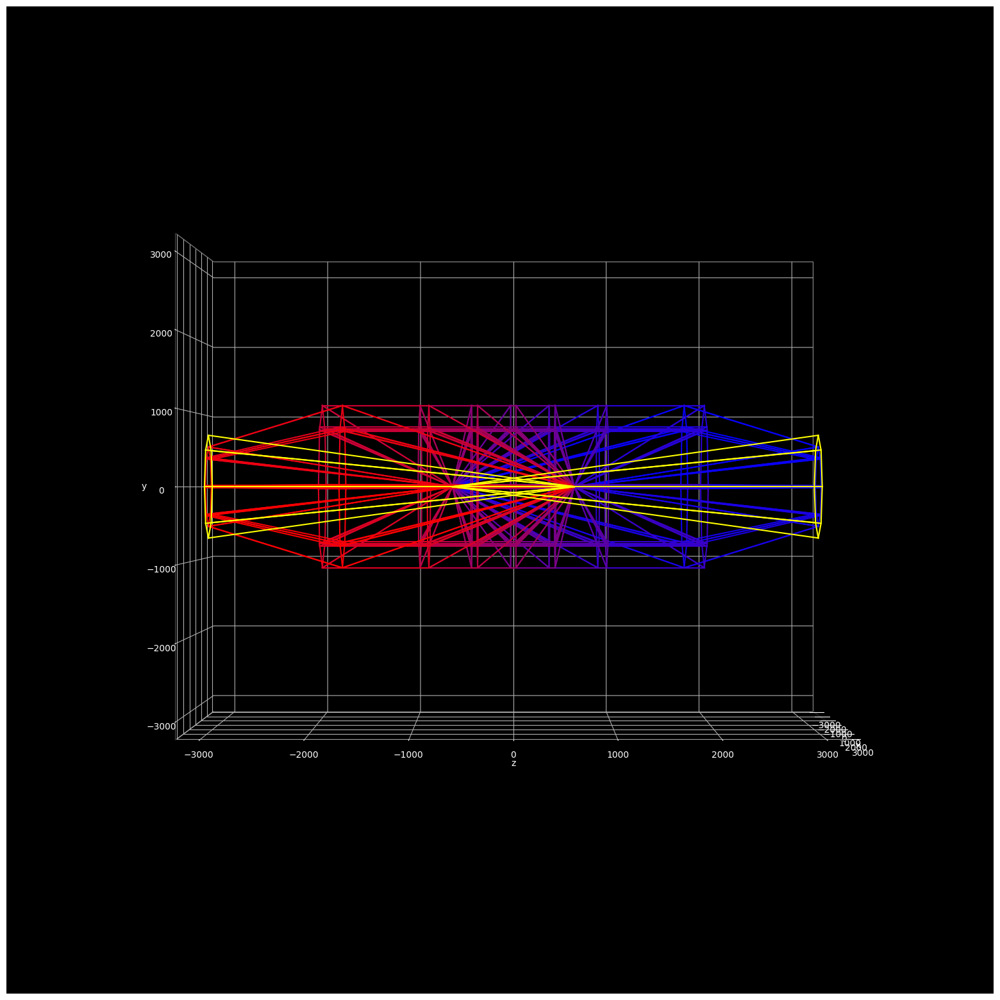

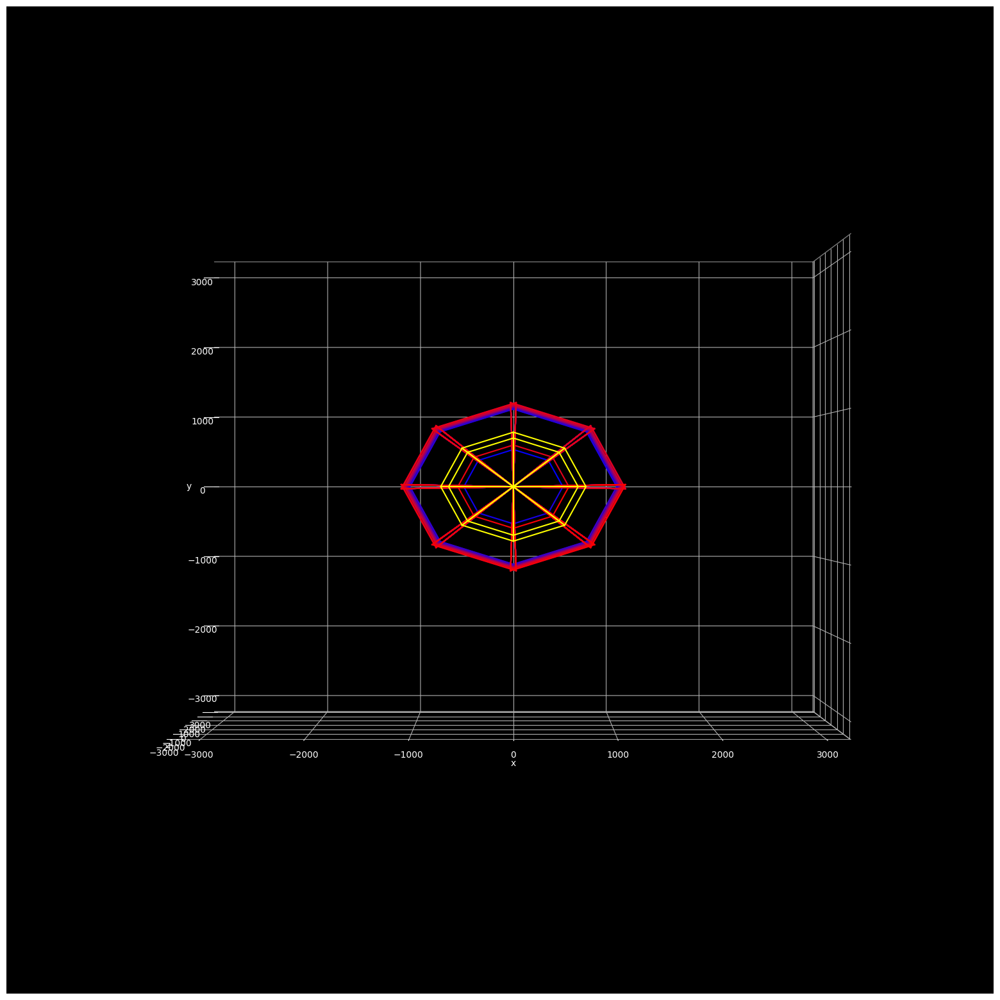

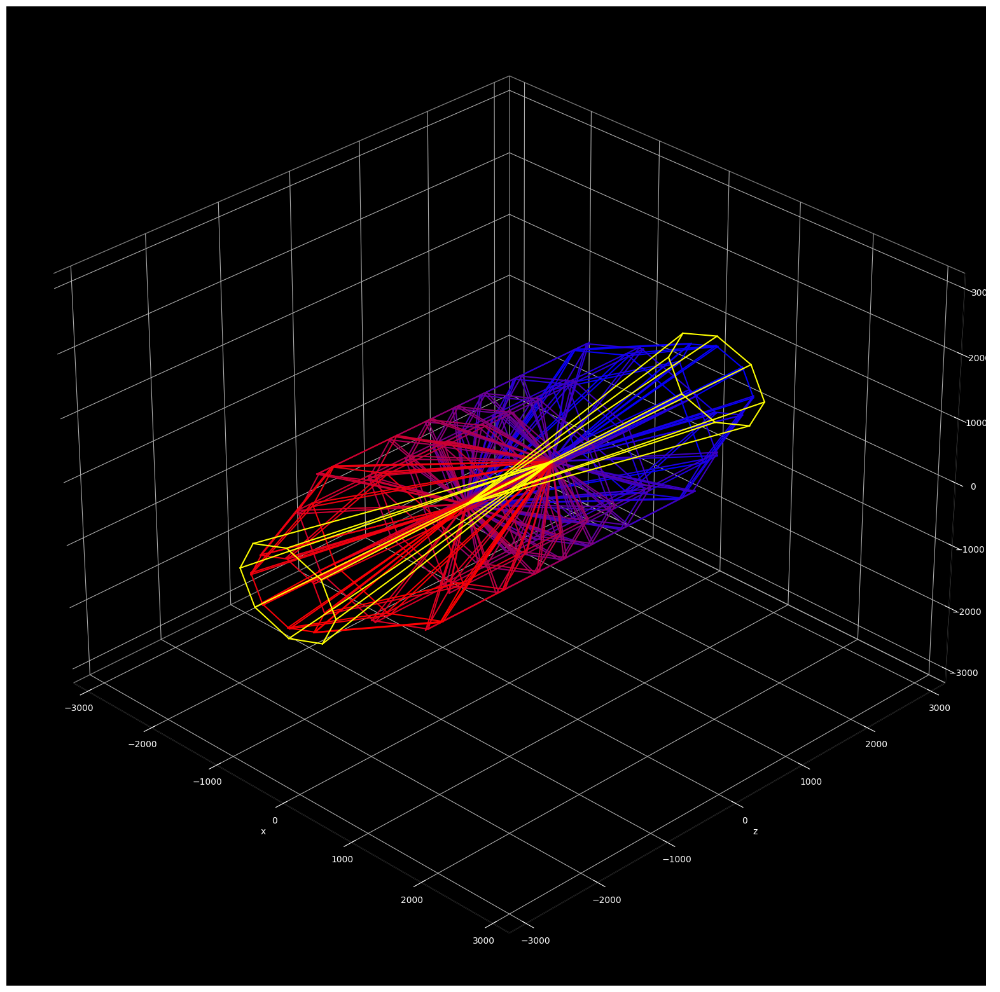

In [78]:
def get_wedges_and_pole_regions(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin=0):
    return get_wedges(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin), get_pole_regions(min_x_angle, interaction_region_width, margin)

num_z_ranges = 8
num_x_ranges = 8
min_x_angle = 4 / 64 * math.pi
interaction_region_width = 2 * 0.2 * DetectorProperties.max_abs_z
margin = 2 / 256 * math.pi
wedges, pole_regions = get_wedges_and_pole_regions(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin)

perspectives = []
perspectives.append({'elev': 0, 'azim': 0, 'roll': 0})
perspectives.append({'elev': 0, 'azim': 270, 'roll': 0})
perspectives.append({'elev': 30, 'azim': -45, 'roll': 0})
for perspective in perspectives:
    figure, ax = get_3d_plot_figure(figure_size=(20, 20), keep_aspect_ratio=True)
    ax.view_init(elev=perspective['elev'], azim=perspective['azim'], roll=perspective['roll'])
    for i in range(len(wedges)):
        red = (i / (len(wedges) - 1))
        blue = 1 - red
        plot_wedge_lines(figure, ax, wedges[i], color=(red, 0, blue))
    for pole_region in pole_regions:
        plot_pole_region(figure, ax, pole_region, num_rays=num_z_ranges, color='yellow')

Red points:  333
Blue points:  310
Yellow points:  366
Green points:  152


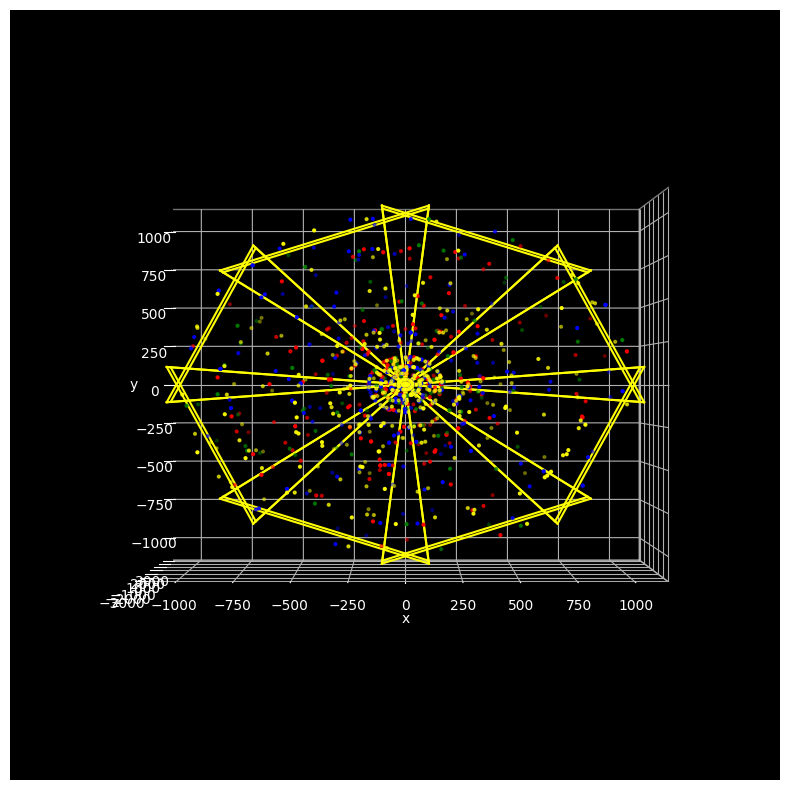

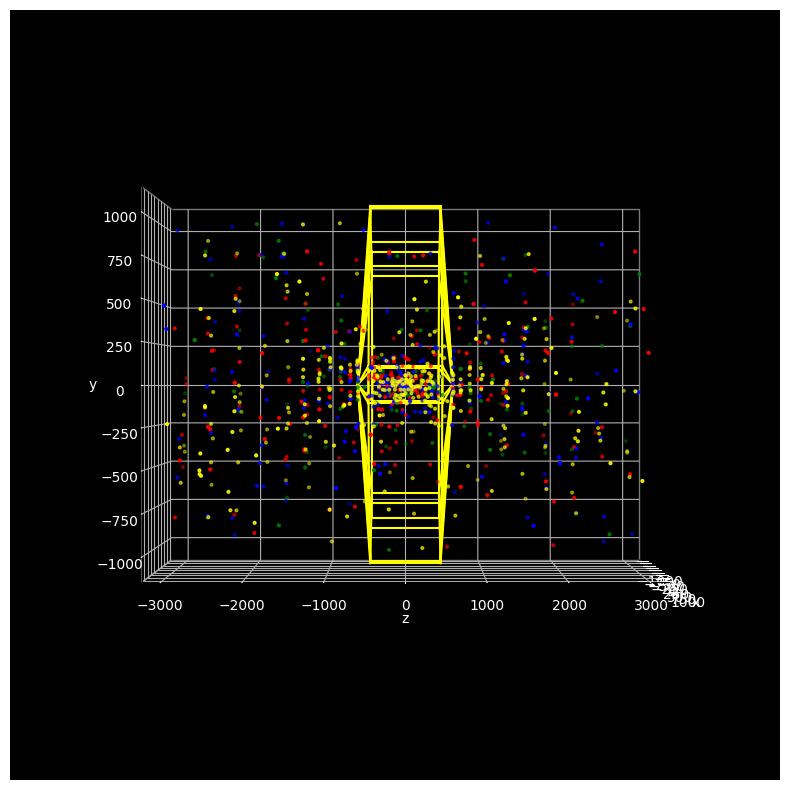

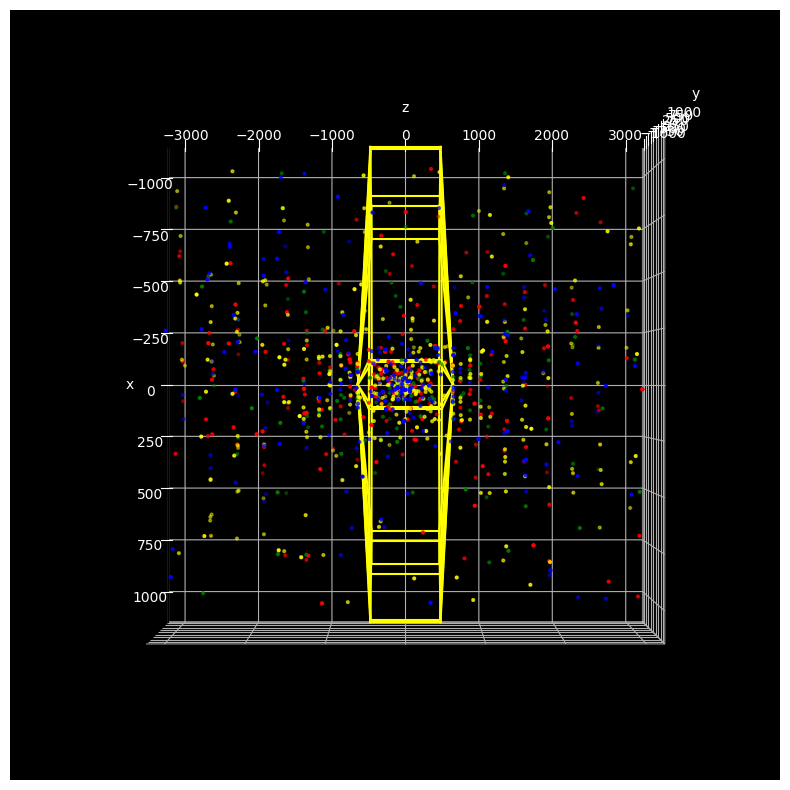

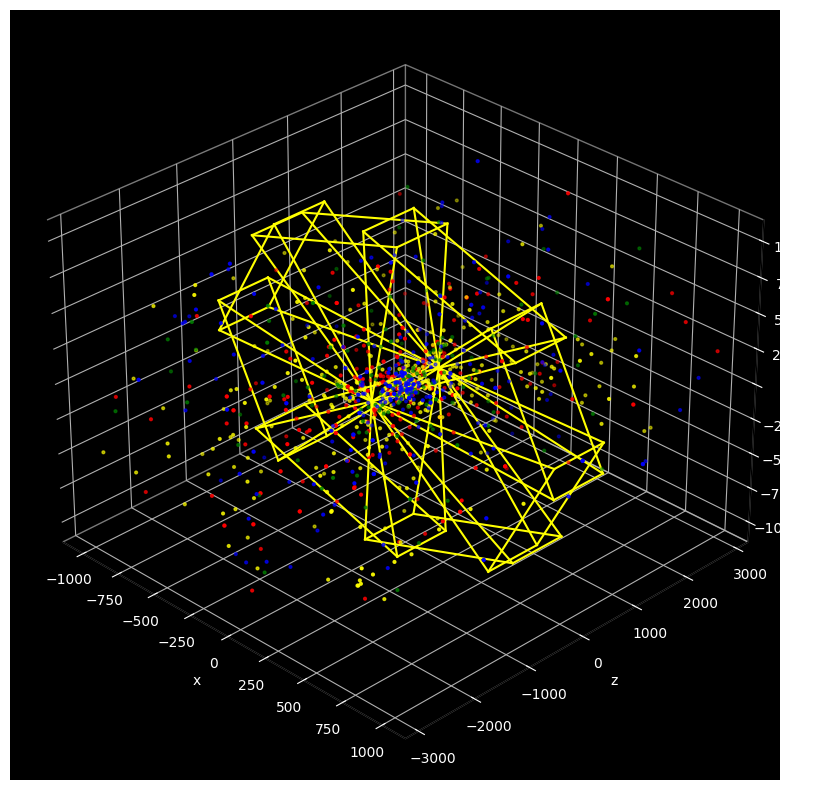

In [79]:
def color_code_test(point_in_region_func, plot_region_func, regions, points):
    red_points = []
    blue_points = []
    for i in range(len(regions)):
        points_in_region = [point for point in points if point_in_region_func(point, regions[i])]
        if i % 2 == 0:
            red_points.extend(points_in_region)
        else:
            blue_points.extend(points_in_region)

    yellow_points = [point for point in points if point in red_points and point in blue_points]
    red_points = [point for point in red_points if point not in yellow_points]
    blue_points = [point for point in blue_points if point not in yellow_points]
    green_points = [point for point in points if point not in red_points and point not in blue_points and point not in yellow_points]

    print("Red points: ", len(red_points))
    print("Blue points: ", len(blue_points))
    print("Yellow points: ", len(yellow_points))
    print("Green points: ", len(green_points))

    perspectives = []
    perspectives.append({'elev': 0, 'azim': 270, 'roll': 0})
    perspectives.append({'elev': 0, 'azim': 0, 'roll': 0})
    perspectives.append({'elev': 90, 'azim': 0, 'roll': 0})
    perspectives.append({'elev': 30, 'azim': -45, 'roll': 0})
    for perspective in perspectives:
        figure, ax = get_3d_plot_figure(figure_size=(10, 10))
        ax.view_init(elev=perspective['elev'], azim=perspective['azim'], roll=perspective['roll'])
        for region in regions:
            plot_region_func(figure, ax, region)
        plot_points(red_points, len(red_points), figure=figure, ax=ax, color='red')
        plot_points(blue_points, len(blue_points), figure=figure, ax=ax, color='blue')
        plot_points(yellow_points, len(yellow_points), figure=figure, ax=ax, color='yellow')
        plot_points(green_points, len(green_points), figure=figure, ax=ax, color='green')

margin = 8 / 256 * math.pi
num_z_ranges = 8
z_ranges = [(angle_wrap_2pi(i[0]), angle_wrap_2pi(i[1])) for i in uniform_range_split(num_z_ranges, 0, 2 * math.pi, margin)]
wedges = []
for z_range in z_ranges:
    wedges.append(Wedge(z_range[0], z_range[1], 3 / 8 * math.pi, 5 / 8 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z))

def random_point_in(point, region):
    return random.random() < 0.2

color_code_test(random_point_in, plot_wedge_lines, wedges, random.sample(points, 1000))

Red points:  359
Blue points:  396
Yellow points:  245
Green points:  0


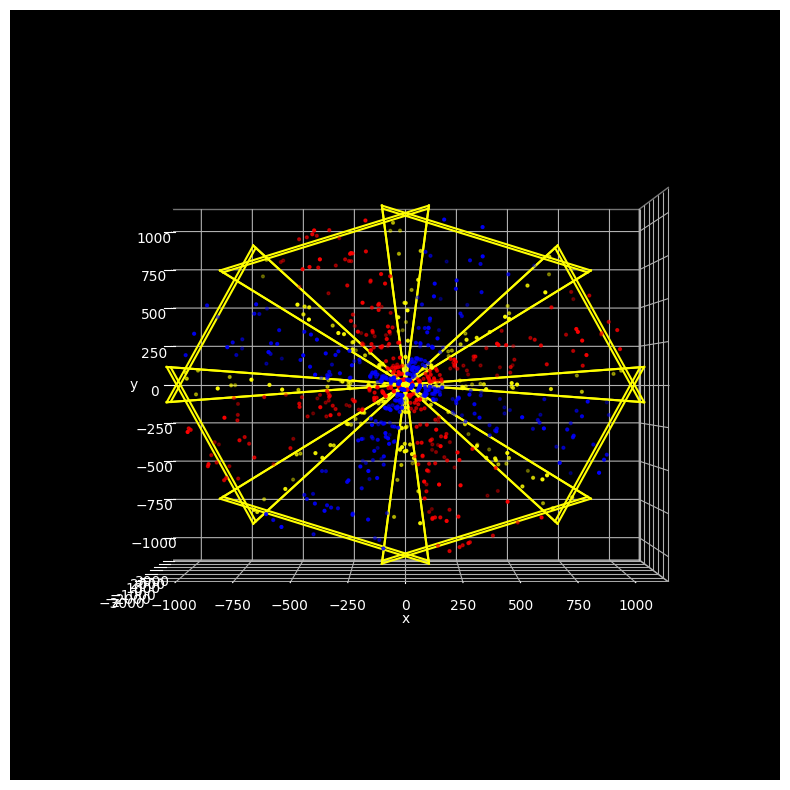

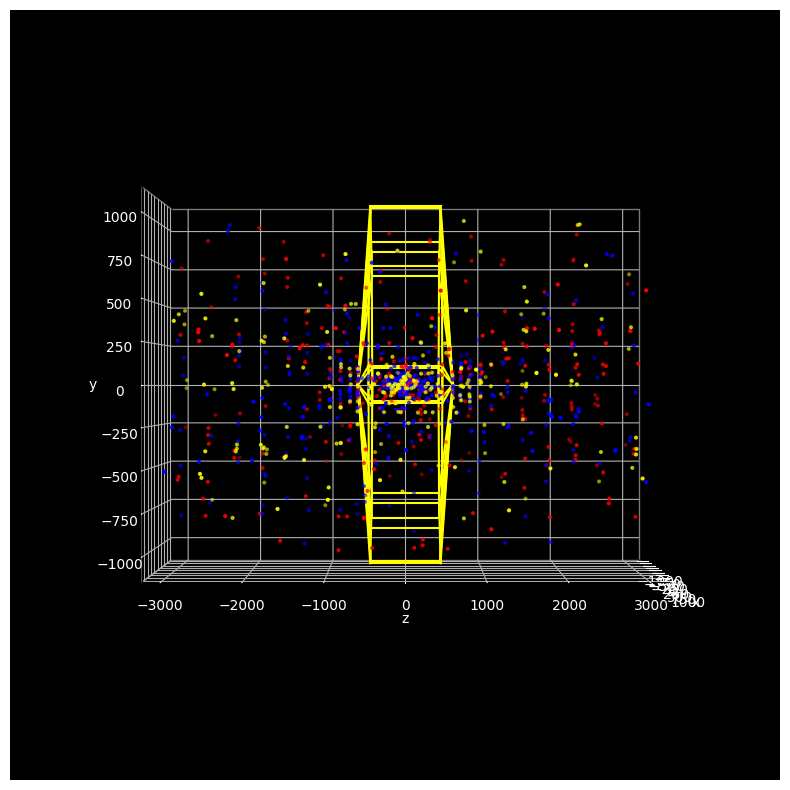

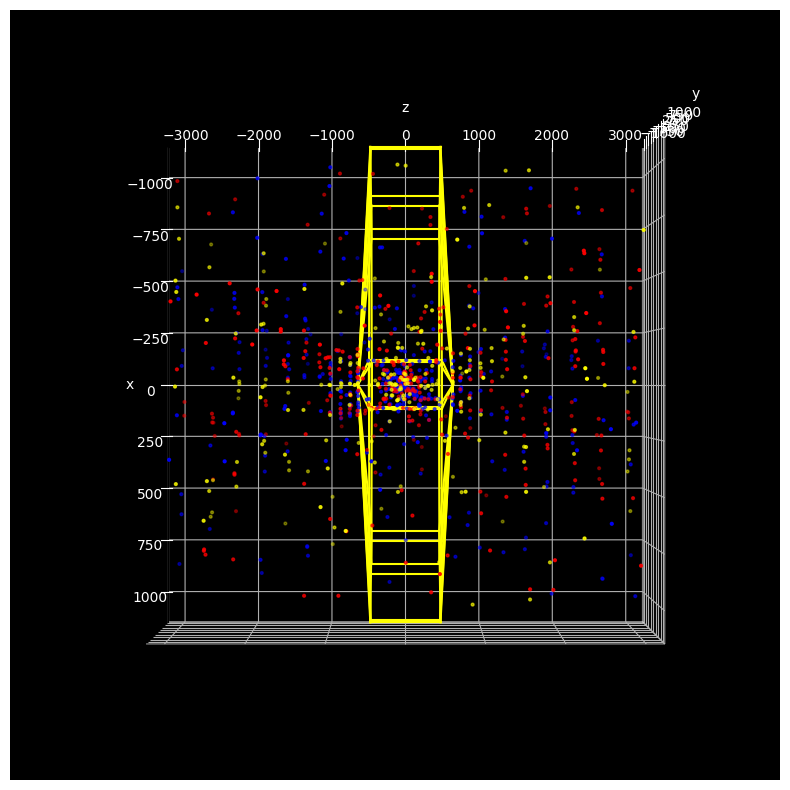

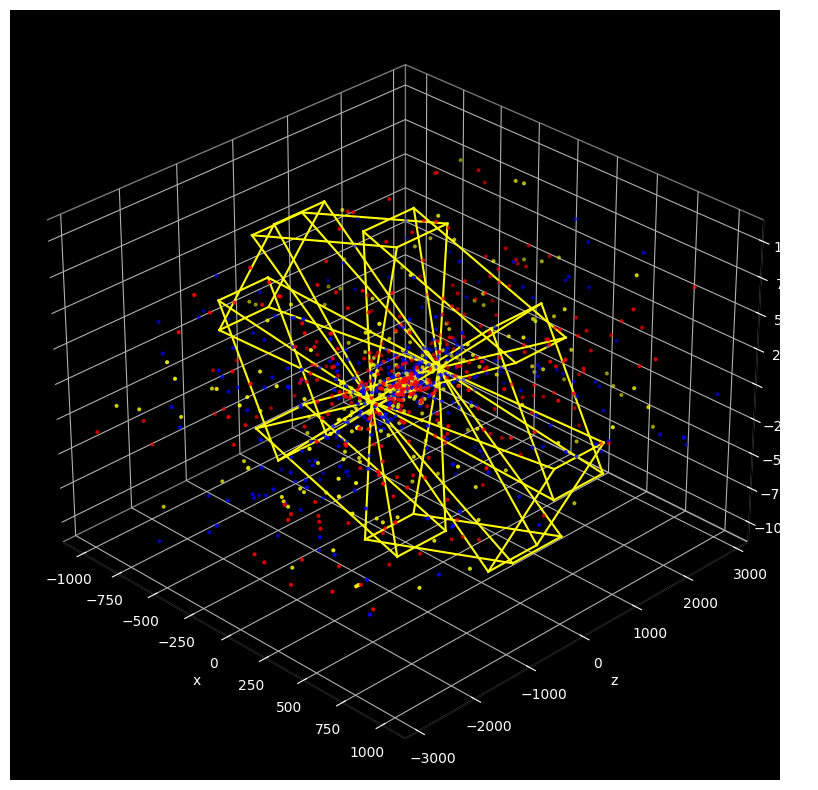

In [80]:
def point_in_wedge_z_angle(point, wedge):
    # Assumes wedge's z_angle_min and z_angle_max are in [0, 2 * math.pi)
    # Assumes wedge's z angle range is < math.pi

    z_angle = atan2_2pi(point['y'], point['x'])
    if wedge.z_angle_min < wedge.z_angle_max:
        if z_angle < wedge.z_angle_min or z_angle > wedge.z_angle_max:
            return False
    else:
        # wedge crosses z_angle = 0
        if (z_angle <= math.pi and z_angle > wedge.z_angle_max) or (z_angle > math.pi and z_angle < wedge.z_angle_min):
            return False

    return True

margin = 8 / 256 * math.pi
# margin = 0
num_z_ranges = 8
z_ranges = [(angle_wrap_2pi(i[0]), angle_wrap_2pi(i[1])) for i in uniform_range_split(num_z_ranges, 0, 2 * math.pi, margin)]
wedges = []
for z_range in z_ranges:
    wedges.append(Wedge(z_range[0], z_range[1], 3 / 8 * math.pi, 5 / 8 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z))

color_code_test(point_in_wedge_z_angle, plot_wedge_lines, wedges, random.sample(points, 1000))

# TODO: fix all below

Red points:  103
Blue points:  122
Yellow points:  596
Green points:  179


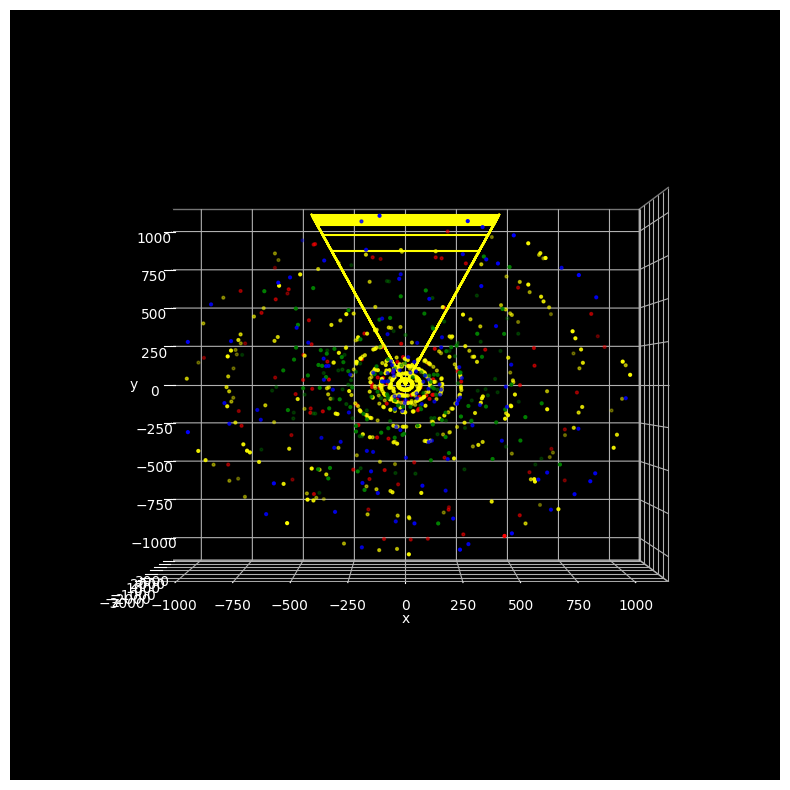

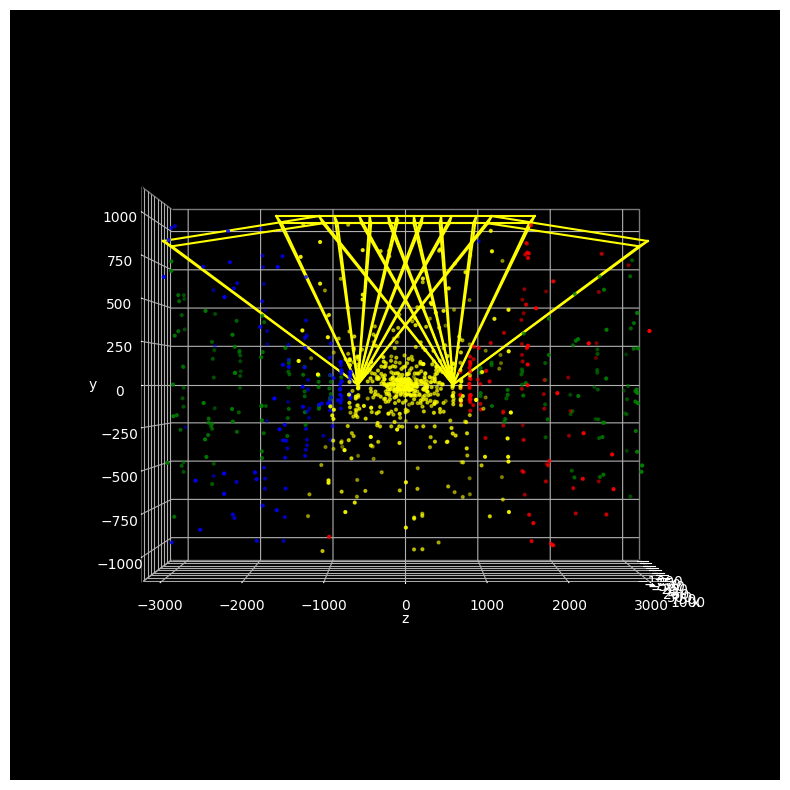

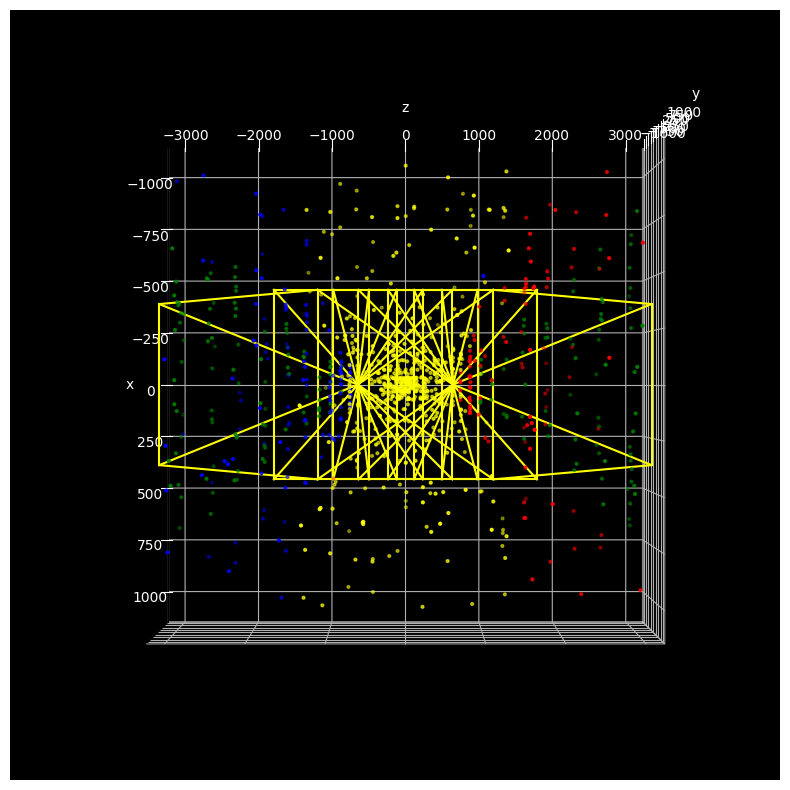

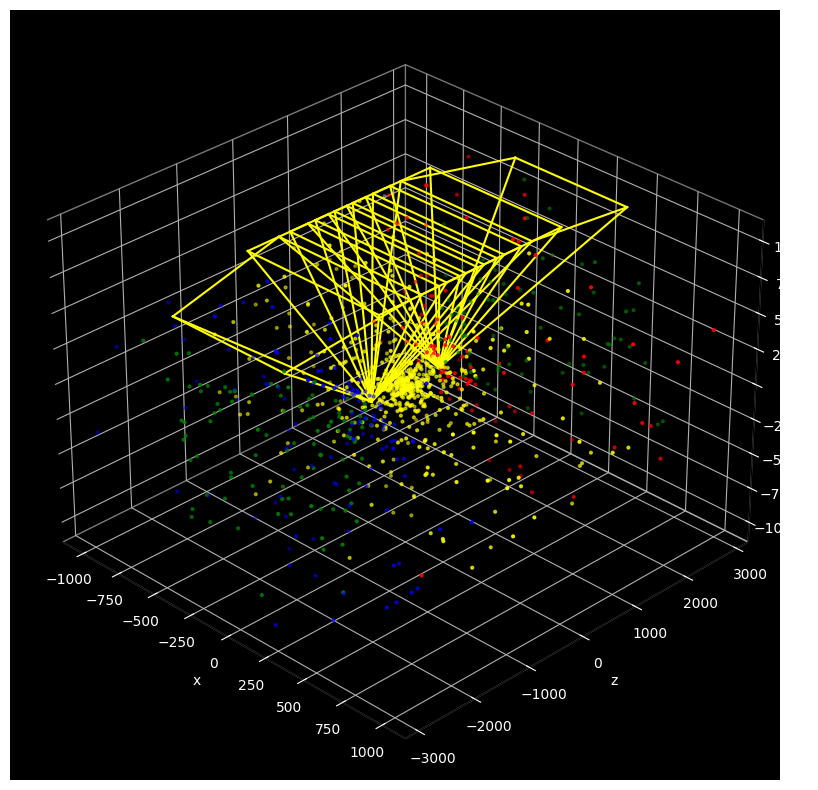

In [81]:
def point_in_wedge_x_angle(point, wedge):
    # Assumes wedge's x_angle_min and x_angle_max are in [0, math.pi)

    def outermost_point(x_angle):
        x_plane_direction_z = math.cos(x_angle)
        x_plane_direction_y = math.sin(x_angle)

        x_plane_scale_to_z_limit = abs(x_plane_direction_z) / DetectorProperties.max_abs_z
        x_plane_scale_to_y_limit = abs(x_plane_direction_y) / DetectorProperties.max_abs_xy
        scale = 1 / max(x_plane_scale_to_z_limit, x_plane_scale_to_y_limit)

        x = x_plane_direction_y * math.cos(wedge.z_angle_min) * scale
        y = x_plane_direction_y * math.sin(wedge.z_angle_min) * scale
        z = x_plane_direction_z * scale
        return x, y, z

    def to_z_angle(x, y, z, interaction_region_shift):
        distance_to_z = math.sqrt(x ** 2 + y ** 2)
        return math.atan2(distance_to_z, z - interaction_region_shift)

    interaction_region_shift = wedge.interaction_region_width / 2
    outermost_x, outermost_y, outermost_z = outermost_point(wedge.x_angle_min)
    boundary_to_z_angle = to_z_angle(outermost_x, outermost_y, outermost_z, interaction_region_shift)
    point_to_z_angle = to_z_angle(point['x'], point['y'], point['z'], interaction_region_shift)
    if point_to_z_angle < boundary_to_z_angle:
        return False
    
    interaction_region_shift = -wedge.interaction_region_width / 2
    outermost_x, outermost_y, outermost_z = outermost_point(wedge.x_angle_max)
    boundary_to_z_angle = to_z_angle(outermost_x, outermost_y, outermost_z, interaction_region_shift)
    point_to_z_angle = to_z_angle(point['x'], point['y'], point['z'], interaction_region_shift)
    if point_to_z_angle > boundary_to_z_angle:
        return False

    return True
        

# Remember to test with margin = 0 and large margin
margin = 8 / 256 * math.pi
# margin = 0
num_x_ranges = 8
x_ranges = uniform_range_split(num_x_ranges, 8 / 64 * math.pi, 56 / 64 * math.pi, margin)
wedges = []
for x_range in x_ranges:
    wedges.append(Wedge(3 / 8 * math.pi, 5 / 8 * math.pi, x_range[0], x_range[1], 2 * 0.2 * DetectorProperties.max_abs_z))

color_code_test(point_in_wedge_x_angle, plot_wedge_lines, wedges, random.sample(points, 1000))

Red points:  153
Blue points:  164
Yellow points:  99
Green points:  584
Red points:  50
Blue points:  51
Yellow points:  170
Green points:  729


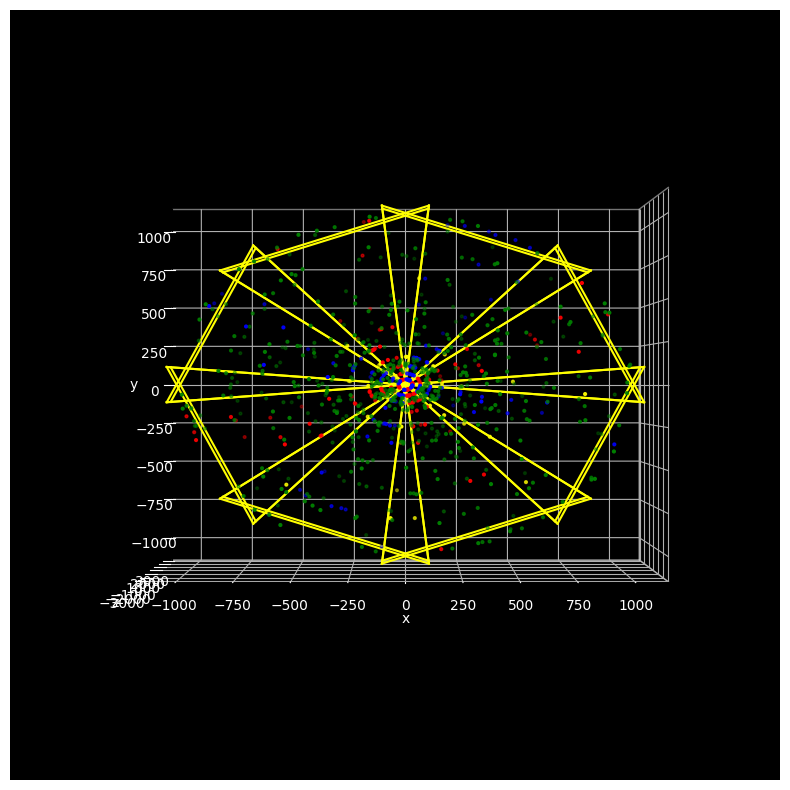

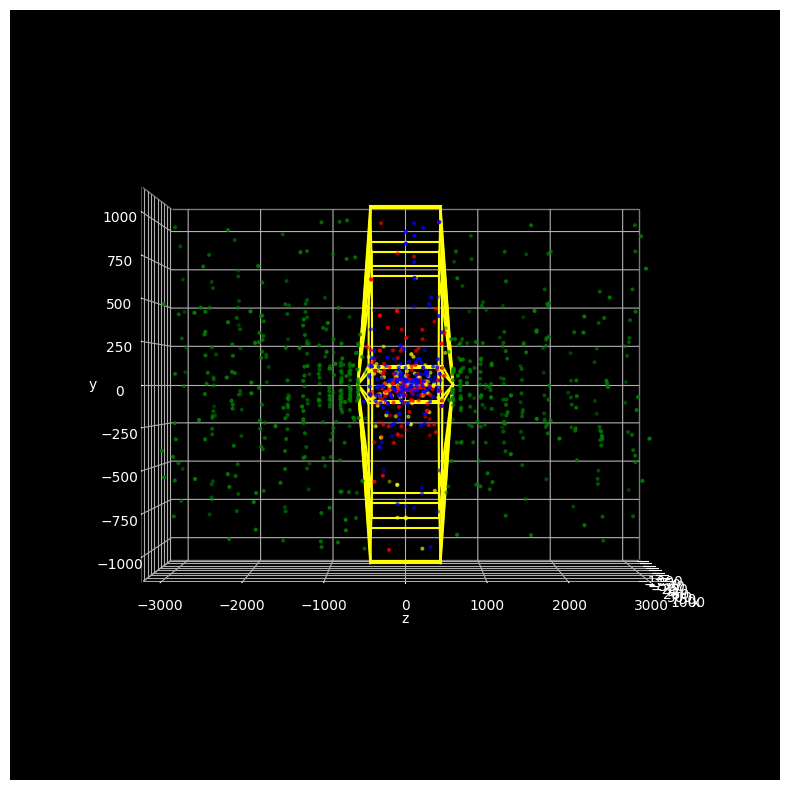

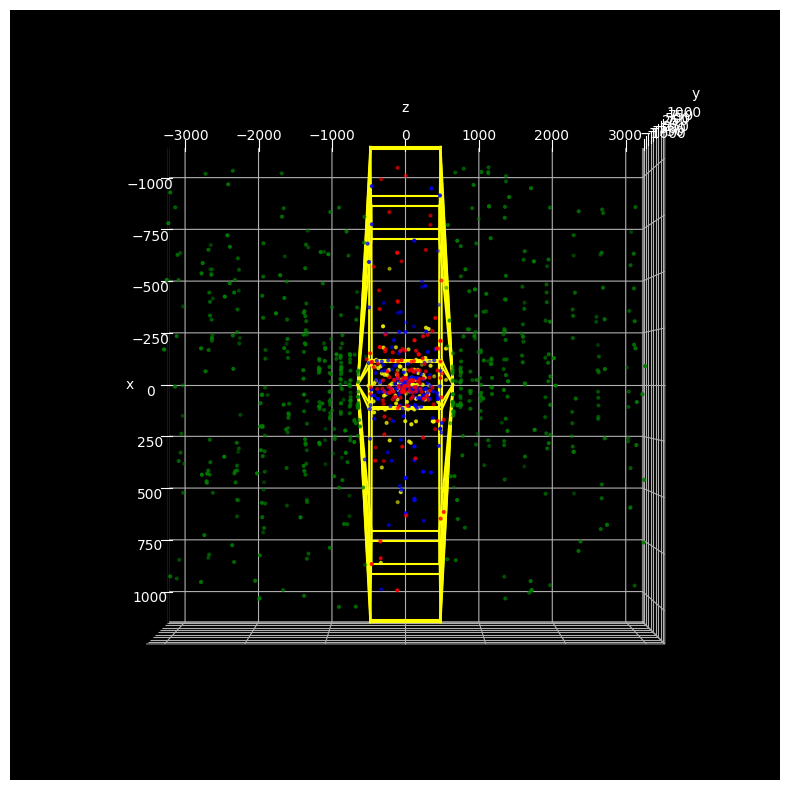

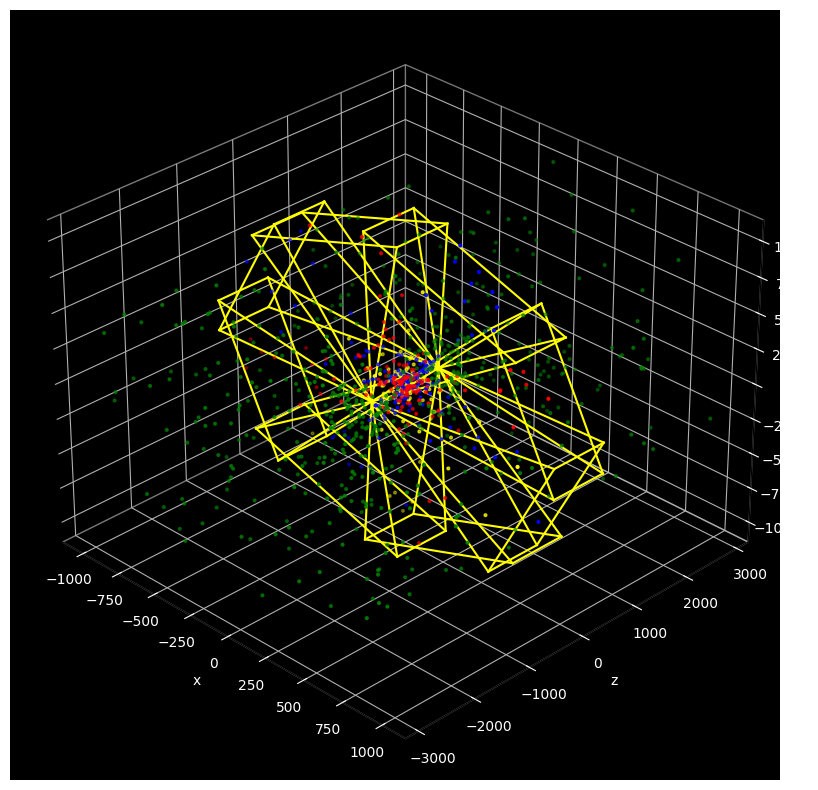

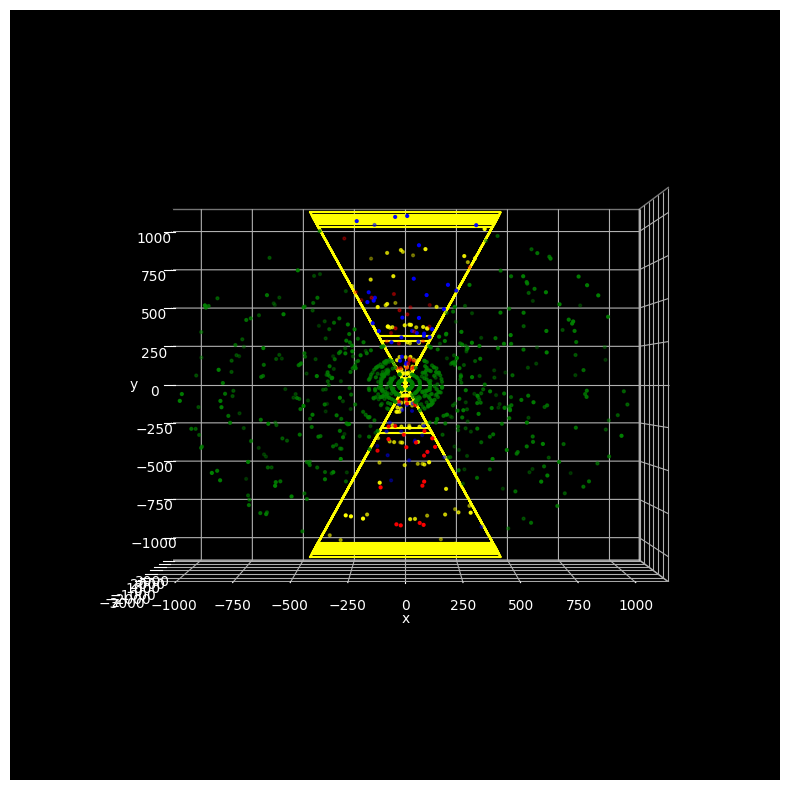

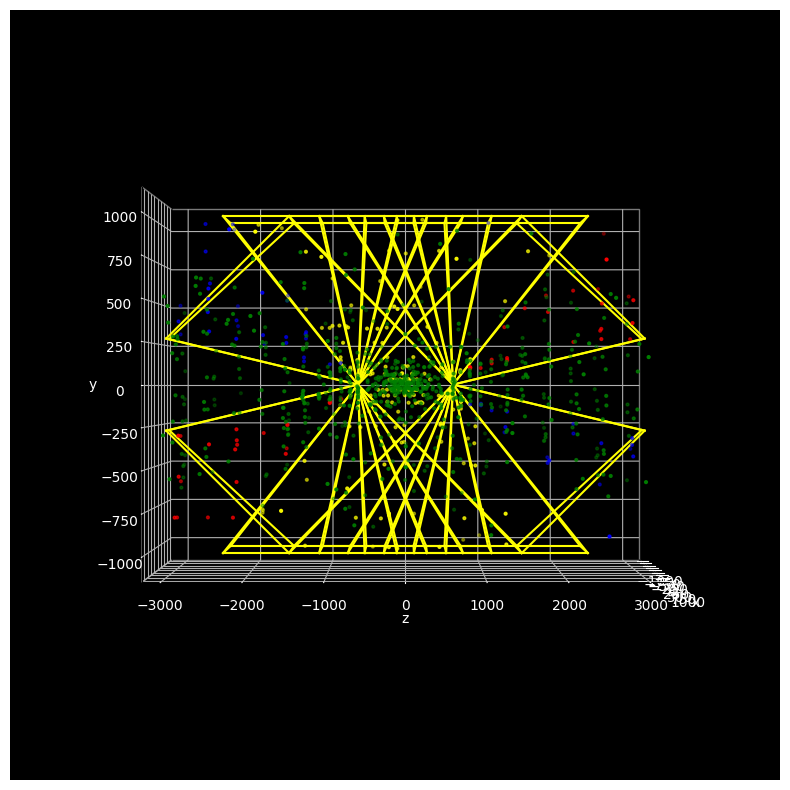

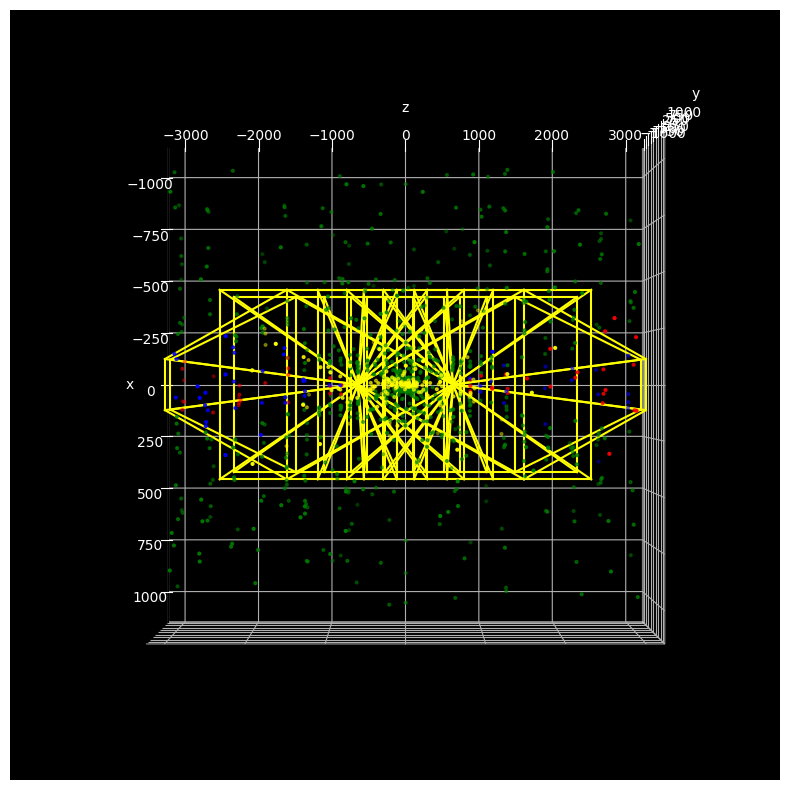

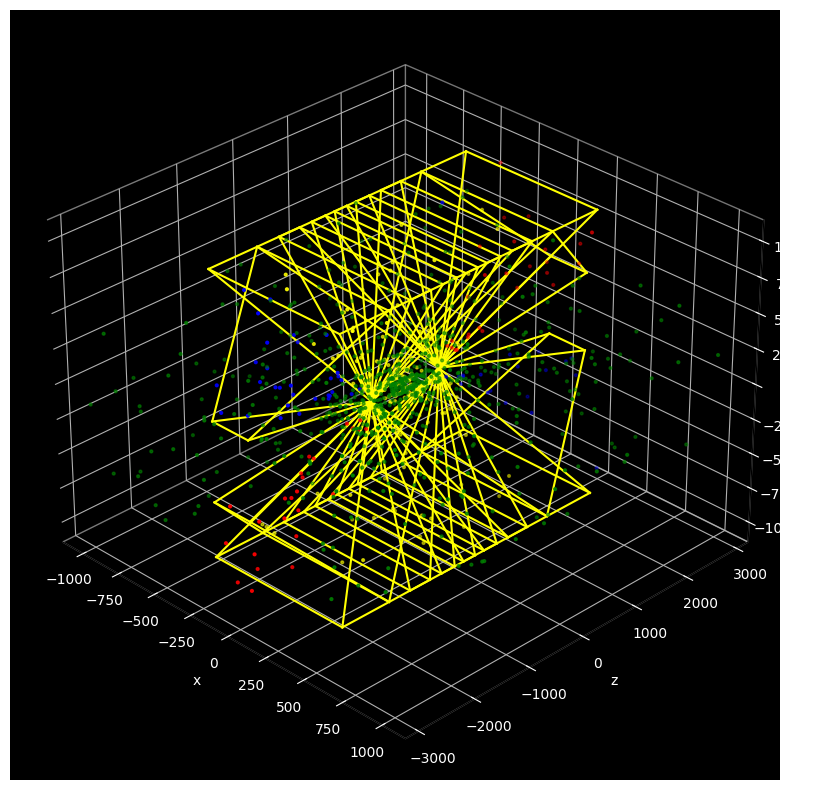

In [82]:
def point_in_wedge(point, wedge):
    # Assumes wedge's z_angle_min and z_angle_max are in [0, 2 * math.pi)
    # Assumes wedge's z angle range is < math.pi
    # Assumes wedge's x_angle_min and x_angle_max are in [0, math.pi)
    return point_in_wedge_z_angle(point, wedge) and point_in_wedge_x_angle(point, wedge)
        
# Remember to test with margin = 0 and large margin
margin = 8 / 256 * math.pi
# margin = 0
num_z_ranges = 8
z_ranges = [(angle_wrap_2pi(i[0]), angle_wrap_2pi(i[1])) for i in uniform_range_split(num_z_ranges, 0, 2 * math.pi, margin)]
wedges = []
for z_range in z_ranges:
    wedges.append(Wedge(z_range[0], z_range[1], 3 / 8 * math.pi, 5 / 8 * math.pi, 2 * 0.2 * DetectorProperties.max_abs_z))

color_code_test(point_in_wedge, plot_wedge_lines, wedges, random.sample(points, 1000))

# Remember to test with margin = 0 and large margin
margin = 8 / 256 * math.pi
# margin = 0
num_x_ranges = 8
x_ranges = uniform_range_split(num_x_ranges, 4 / 64 * math.pi, 60 / 64 * math.pi, margin)
wedges = []
for x_range in x_ranges:
    wedges.append(Wedge(3 / 8 * math.pi, 5 / 8 * math.pi, x_range[0], x_range[1], 2 * 0.2 * DetectorProperties.max_abs_z))
for x_range in reversed(x_ranges):
    wedges.append(Wedge(11 / 8 * math.pi, 13 / 8 * math.pi, x_range[0], x_range[1], 2 * 0.2 * DetectorProperties.max_abs_z))

color_code_test(point_in_wedge, plot_wedge_lines, wedges, random.sample(points, 1000))

Red points:  123
Blue points:  93
Yellow points:  612
Green points:  172


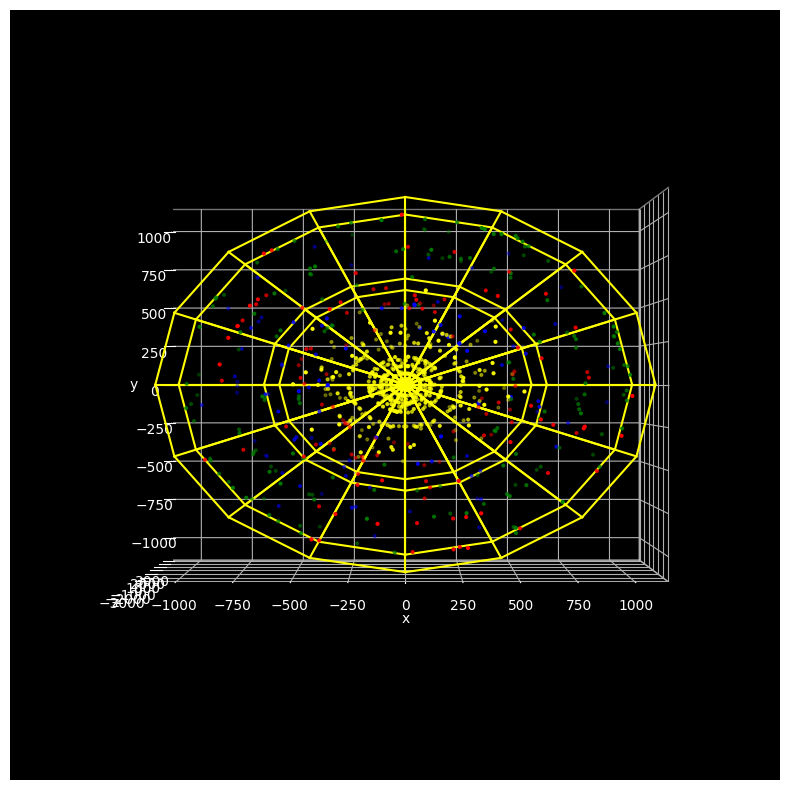

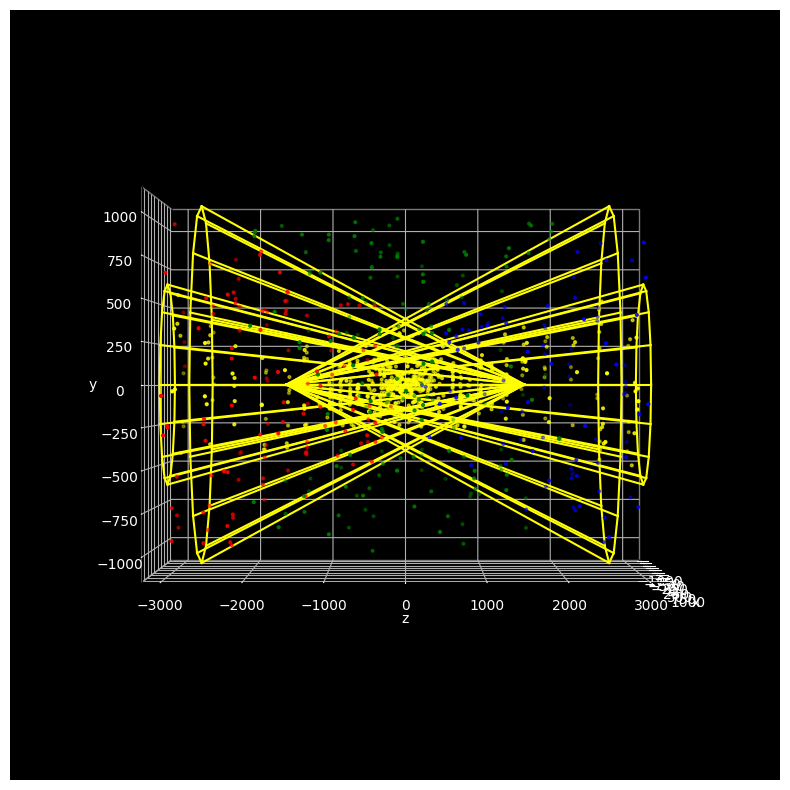

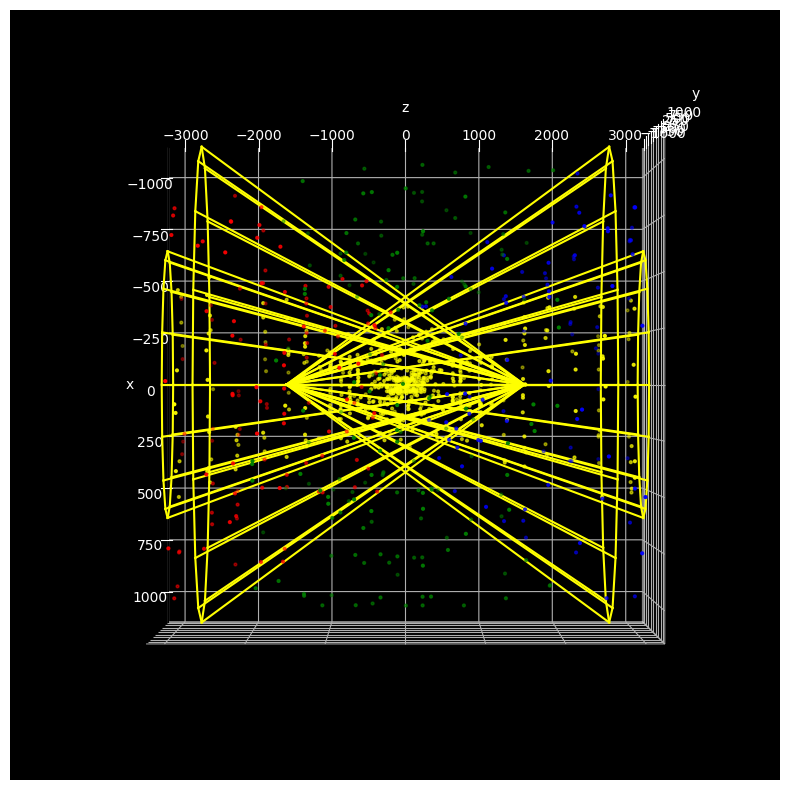

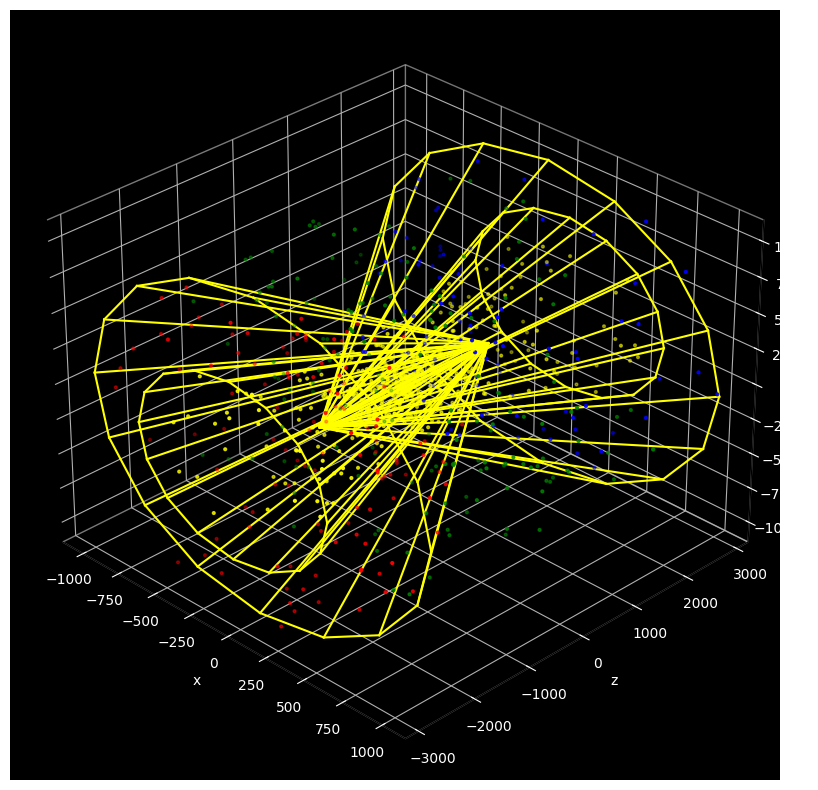

In [83]:
def point_in_pole_region(point, region):
    # Assumes region's x_angle is in [0, math.pi)

    def x_plane_outermost_yz(x_angle):
        x_plane_direction_z = math.cos(x_angle)
        x_plane_direction_y = math.sin(x_angle)

        x_plane_scale_to_z_limit = abs(x_plane_direction_z) / DetectorProperties.max_abs_z
        x_plane_scale_to_y_limit = abs(x_plane_direction_y) / DetectorProperties.max_abs_xy
        scale = 1 / max(x_plane_scale_to_z_limit, x_plane_scale_to_y_limit)

        return x_plane_direction_y * scale, x_plane_direction_z * scale
    
    def to_z_angle(point, interaction_region_shift):
        distance_to_z = math.sqrt(point['x'] ** 2 + point['y'] ** 2)
        z = point['z'] - interaction_region_shift
        return math.atan2(distance_to_z, z)
    
    x_plane_outermost_y, x_plane_outermost_z = x_plane_outermost_yz(region.x_angle)
    interaction_region_shift = (-1 if region.x_angle < math.pi / 2 else 1) * region.interaction_region_width / 2
    boundary_to_z_angle = math.atan2(x_plane_outermost_y, x_plane_outermost_z - interaction_region_shift)
    point_to_z_angle = to_z_angle(point, interaction_region_shift)

    if (region.x_angle < math.pi / 2 and point_to_z_angle > boundary_to_z_angle) or (region.x_angle > math.pi / 2 and point_to_z_angle < boundary_to_z_angle):
        return False

    return True

pole_regions = []
pole_regions.append(PoleRegion(4 / 64 * math.pi, 2 * 0.5 * DetectorProperties.max_abs_z))
pole_regions.append(PoleRegion(8 / 64 * math.pi, 2 * 0.5 * DetectorProperties.max_abs_z))
pole_regions.append(PoleRegion(56 / 64 * math.pi, 2 * 0.5 * DetectorProperties.max_abs_z))
pole_regions.append(PoleRegion(60 / 64 * math.pi, 2 * 0.5 * DetectorProperties.max_abs_z))

color_code_test(point_in_pole_region, plot_pole_region, pole_regions, random.sample(points, 1000))

Red points:  890
Blue points:  874
Yellow points:  434
Green points:  0


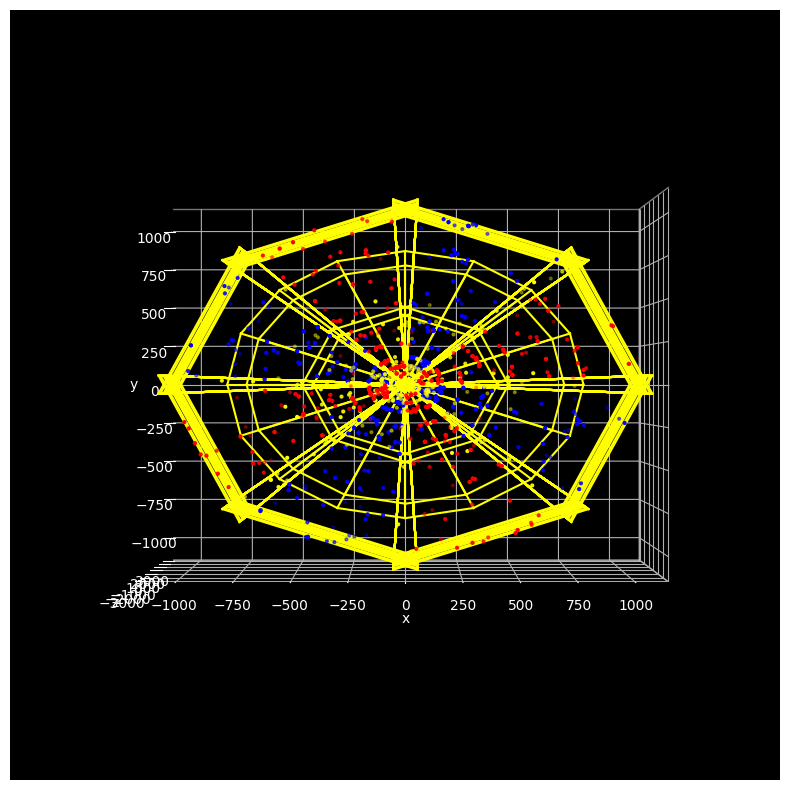

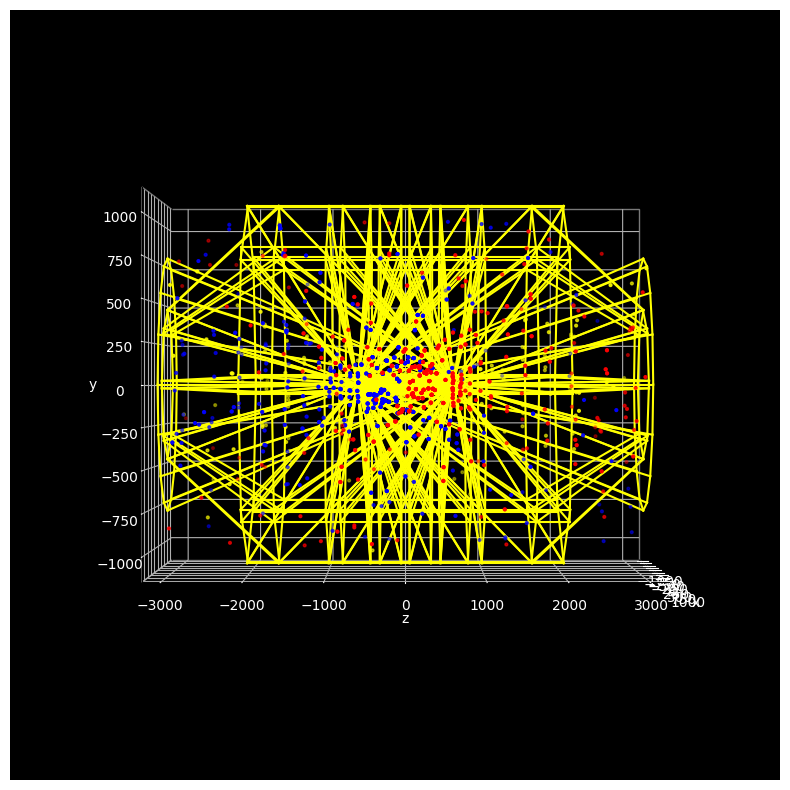

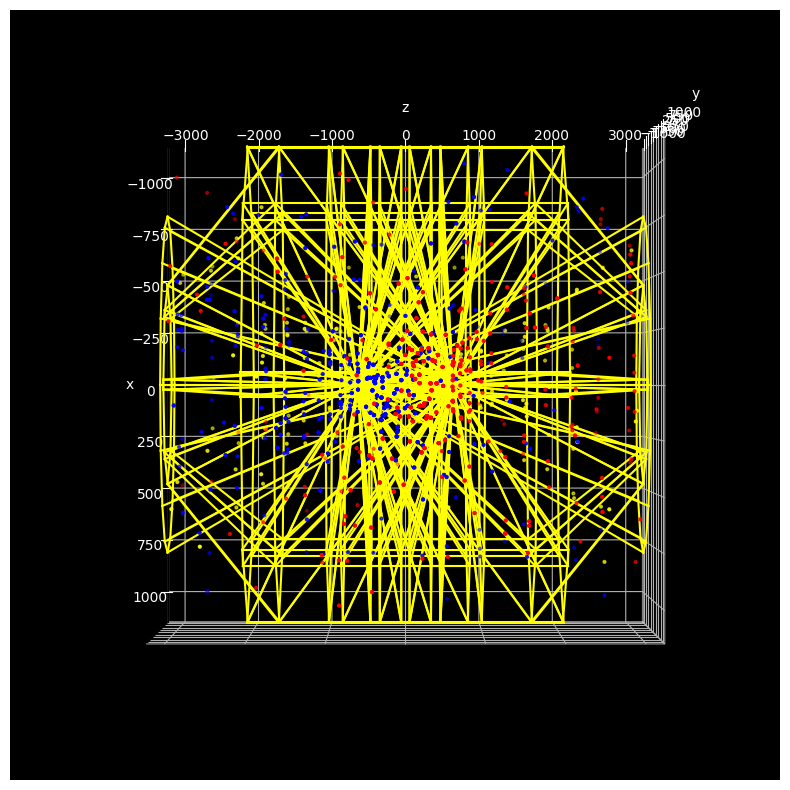

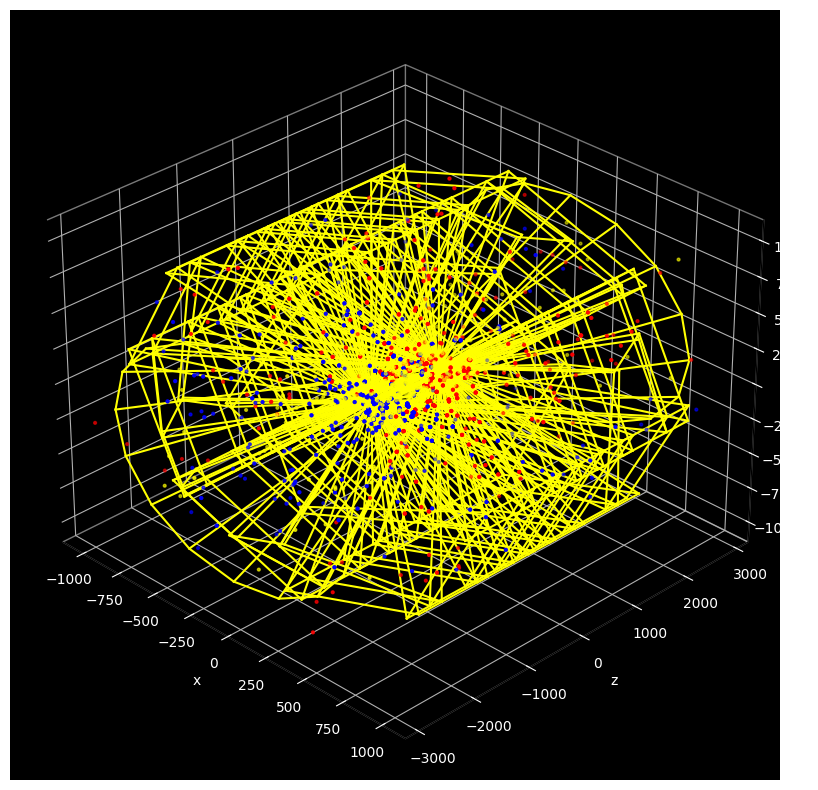

In [84]:
def point_in_region(point, region):
    if isinstance(region, Wedge):
        return point_in_wedge(point, region)
    elif isinstance(region, PoleRegion):
        return point_in_pole_region(point, region)
    else:
        print("Unknown region type")
        return False
    
def plot_region(figure, ax, region):
    if isinstance(region, Wedge):
        plot_wedge_lines(figure, ax, region)
    elif isinstance(region, PoleRegion):
        plot_pole_region(figure, ax, region)
    else:
        print("Unknown region type")
    
num_z_ranges = 8
num_x_ranges = 8
min_x_angle = 4 / 64 * math.pi
interaction_region_width = 2 * 0.2 * DetectorProperties.max_abs_z
margin = 4 / 256 * math.pi
wedges, pole_regions = get_wedges_and_pole_regions(num_z_ranges, num_x_ranges, min_x_angle, interaction_region_width, margin)
regions = wedges + pole_regions

color_code_test(point_in_region, plot_region, regions, random.sample(points, 1000))

Points outside all regions:  0


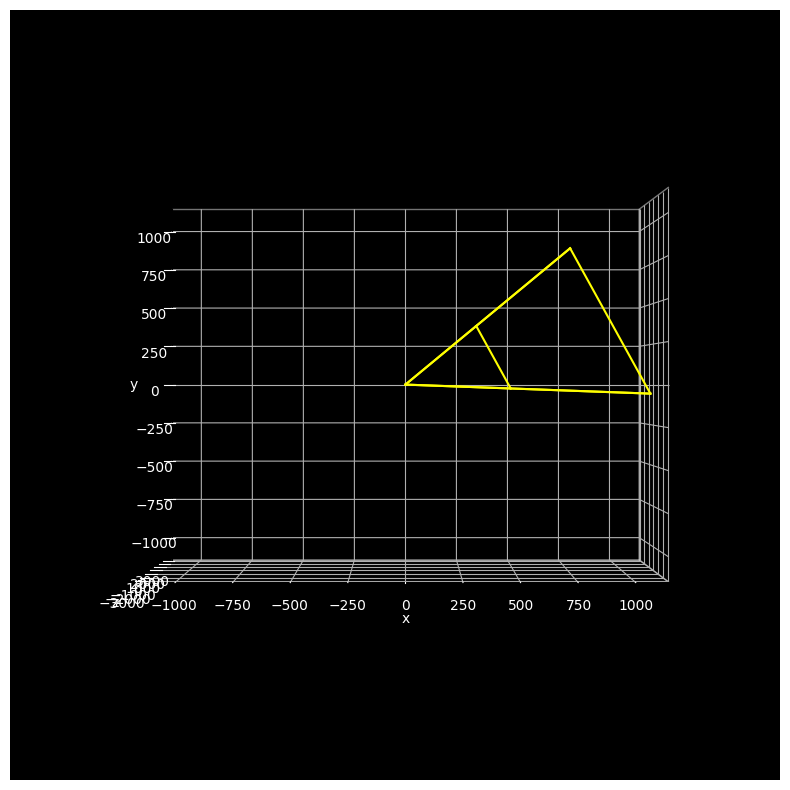

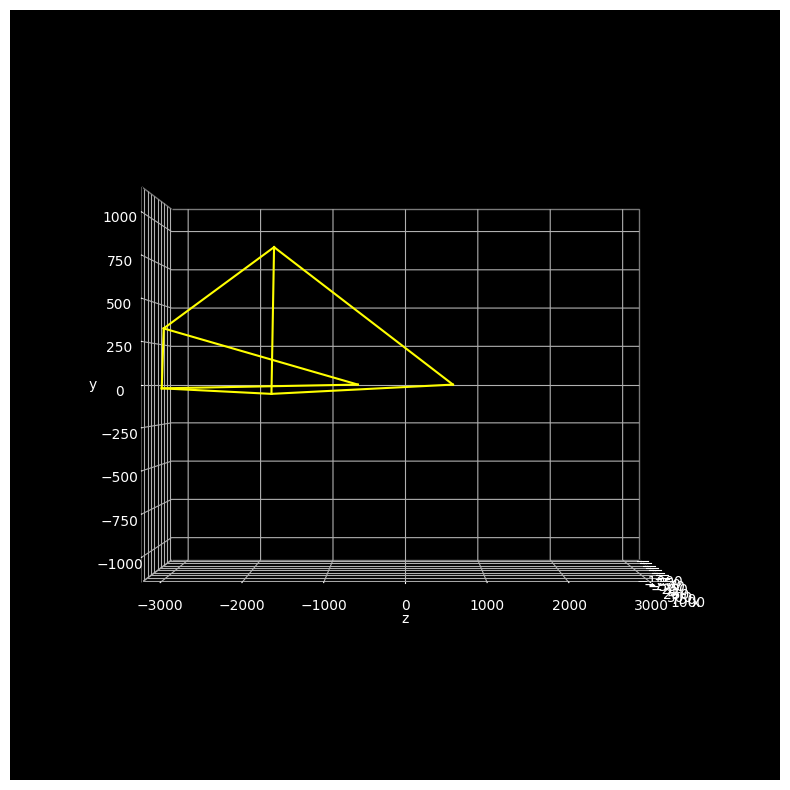

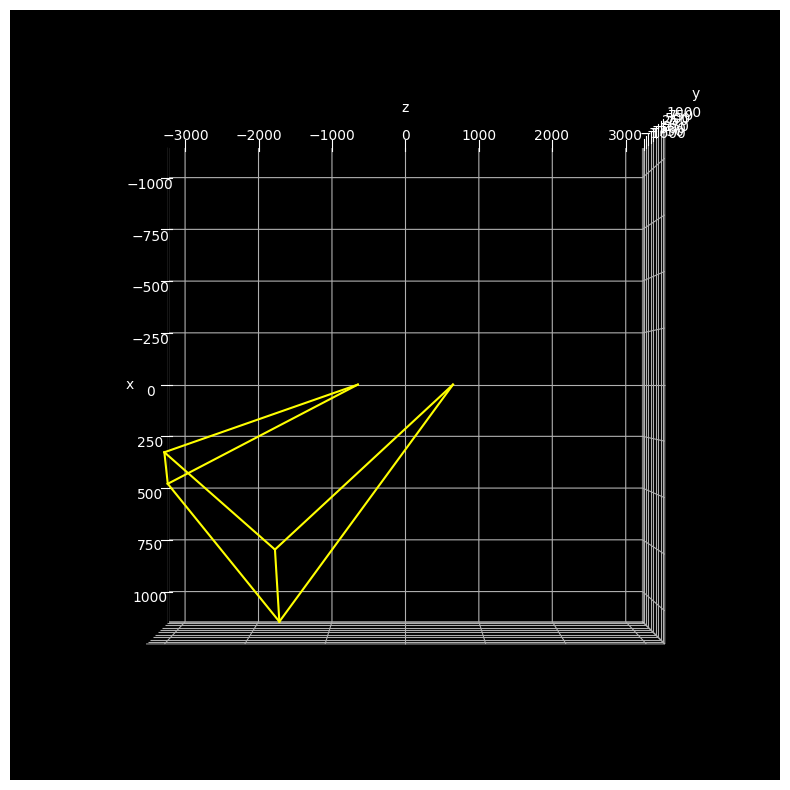

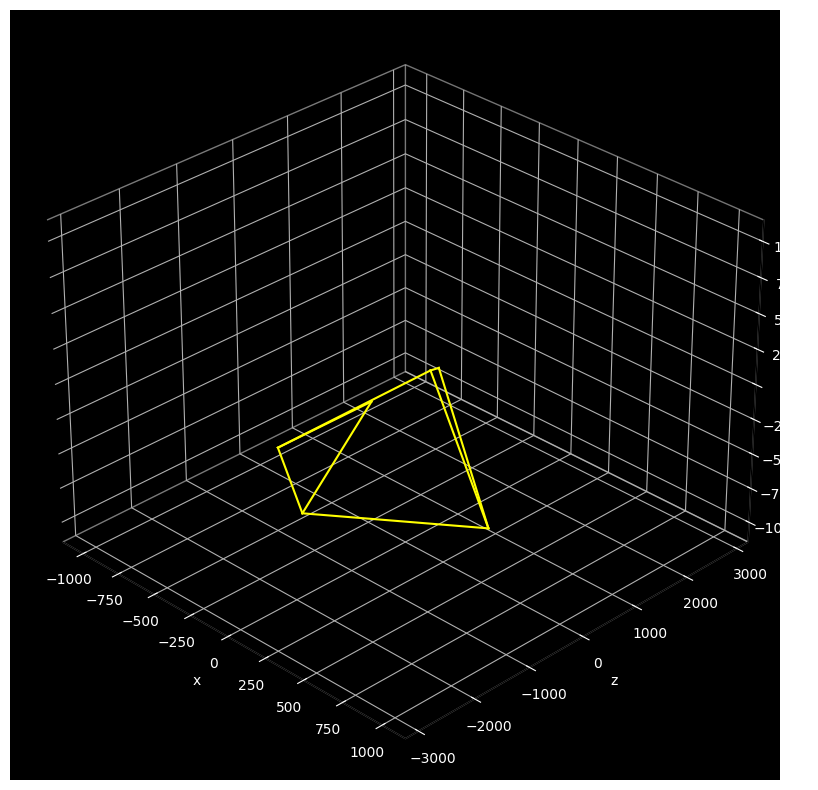

In [85]:
points_outside_all_regions = [point for point in random.sample(points, 10000) if all([not point_in_region(point, region) for region in regions])]
points_outside_all_regions = [point for point in points if all([not point_in_region(point, region) for region in regions])]

print("Points outside all regions: ", len(points_outside_all_regions))
perspectives = []
perspectives.append({'elev': 0, 'azim': 270, 'roll': 0})
perspectives.append({'elev': 0, 'azim': 0, 'roll': 0})
perspectives.append({'elev': 90, 'azim': 0, 'roll': 0})
perspectives.append({'elev': 30, 'azim': -45, 'roll': 0})
for perspective in perspectives:
    figure, ax = get_3d_plot_figure(figure_size=(10, 10))
    ax.view_init(elev=perspective['elev'], azim=perspective['azim'], roll=perspective['roll'])
    regions_to_plot = [wedges[-8]]
    for region in regions_to_plot:
        plot_region(figure, ax, region)
    plot_points(points_outside_all_regions, len(points_outside_all_regions), figure=figure, ax=ax, color='red')